# Spotify Hit Classification

In this notebook I will attempt to build a classifier that determines how likely a song is to become a hit. The data comes from "The Spotify Hit Predictor Dataset (1960-2019)" on Kaggle.

## Data Description

- **Track**: The Name of the track.

- **Artist**: The Name of the Artist.

- **URI**: The resource identifier for the track.

- **Danceability**: Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable. 

- **Energy**: Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale. Perceptual features contributing to this attribute include dynamic range, perceived loudness, timbre, onset rate, and general entropy. 

- **Key**: The estimated overall key of the track. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C?/D?, 2 = D, and so on. If no key was detected, the value is -1.

- **Loudness**: The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typical range between -60 and 0 db. 

- **Mode**: Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.

- **Speechiness**: Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks. 

- **Acousticness**: A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic. The distribution of values for this feature look like this:

- **Instrumentalness**: Predicts whether a track contains no vocals. “Ooh” and “aah” sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly “vocal”. The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0. The distribution of values for this feature look like this:

- **Liveness**: Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live.

- **Valence**: A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).

- **Tempo**: The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration. 

- **Duration_Ms**:  The duration of the track in milliseconds.

- **TimeSignature**: An estimated overall time signature of a track. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure).

- **Chorus_Hit**: This the the author's best estimate of when the chorus would start for the track. Its the timestamp of the start of the third section of the track. This feature was extracted from the data received by the API call for Audio Analysis of that particular track.

- **Sections**: The number of sections the particular track has. This feature was extracted from the data received by the API call for Audio Analysis of that particular track.

- **Target**: The target variable for the track. It can be either '0' or '1'. '1' implies that this song has featured in the weekly list (Issued by Billboards) of Hot-100 tracks in that decade at least once and is therefore a 'hit'. '0' Implies that the track is a 'flop'.

      The author's condition of a track being 'flop' is as follows:

        - The track must not appear in the 'hit' list of that decade.
        - The track's artist must not appear in the 'hit' list of that decade.
        - The track must belong to a genre that could be considered non-mainstream and / or avant-garde. 
        - The track's genre must not have a song in the 'hit' list.
        - The track must have 'US' as one of its markets.

## Imports

In [45]:
import os
os.chdir(r"C:\Users\tom.dawson\Documents\Git Projects\SpotifyMusicData")
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from optbinning import OptimalBinning
import math
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.preprocessing import OrdinalEncoder
import statsmodels.api as sm
from statsmodels.discrete.discrete_model import Logit
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, recall_score, precision_score, accuracy_score, confusion_matrix
from sklearn import tree
from sklearn.datasets import load_iris
import graphviz 

## Functions

In [4]:
def DistributionPlot(Df, PlotVar):
    '''
    Plots the distribution of a given variable in a dataframe
    '''
    Labels = [i for i in range(0, 100, 10)]
    
    BinSize = Df[PlotVar].describe().loc["std"] / 20
    
    fig = ff.create_distplot(
            hist_data = [Df[Df["Target"] == 0][PlotVar].values, Df[Df["Target"] == 1][PlotVar].values]
            , group_labels = [0, 1]
            , bin_size=BinSize
            , show_hist=True)
    
    fig.update_xaxes(
    zeroline = True
    , showgrid = True
    , title=PlotVar)


    fig.update_yaxes(
        zeroline=True
        , showgrid=True
        , title="Distribution")


    fig.update_layout(
        title = dict(text=str(PlotVar) + " Distribution"
                     , font=dict(color="Black", size=20))
        , font = dict(color="Black", size=10)
        , height = 700
        , width = 1100
        , legend_title='Target')

    fig.show(renderer='png', height=700, width=1100)

In [5]:
def Scatter(Df, PlotVar, Hue, Y, Title):
    
    '''
    Produces a plot of data pulled from specified dataframe split by a certain binary population
    PlotVars defines the independent variable
    Hue defines the population for which to split the plots
    Y is the dependent variable
    Title is title of the plot
    '''

    fig = go.Figure()

    fig.add_trace(  
        go.Scatter(
            x = Df[Df[Hue] == 1][PlotVar]
            , y=Df[Df[Hue] == 1][Y]
            , legendgroup=Hue + " = 1"
            , name=Hue + " = 1"
            , mode='markers'
            , line=dict(color='red')
            , marker=dict(size=10, opacity=0.1)
            , showlegend= True))

    fig.add_trace(  
        go.Scatter(
            x = Df[Df[Hue] == 0][PlotVar]
            , y=Df[Df[Hue] == 0][Y]
            , legendgroup=Hue + " = 0"
            , name=Hue + " = 0"
            , mode='markers'
            , line=dict(color='blue')
            , marker=dict(size=10, opacity=0.1)
            , showlegend= True))

    fig.update_xaxes(
        zeroline = True
        , showgrid = True
        , title = PlotVar
        #, range = [0.95*np.min(Df[PlotVar]), 1.05*np.max(Df[PlotVar])]
    )

    fig.update_yaxes(
        zeroline=True
        , showgrid=True
        #, range = [0.95*np.min(Df[Y]), 1.05*np.max(Df[Y])]
        , title = Y)
    
    
    fig.update_layout(
        title = dict(text=Title, font=dict(size=17)))

    fig.update_annotations(
        font = dict(size=14))
    
    fig.show(renderer="png", height=600, width=1000)

In [6]:
def Distribution(Df, Target, Variable):    
    Graph = pd.pivot_table(Df, index=Variable, columns=Target, values="Track", aggfunc=len)
    Graph1 = pd.pivot_table(Df, index=Variable, values=Target, aggfunc="mean").sort_values(by="Target", ascending=False)
    
    Graph = Graph.reindex(Graph1.index)


    fig = make_subplots(specs=[[{"secondary_y": True}]])


    fig.add_trace(
        go.Line(
            y=Graph1[Target]*100
            , x=[Col.title() if type(Col) == "str" else Col for Col in Graph1.index.values]
            , name=Target
            , showlegend= True)
        , secondary_y = True)


    fig.add_trace(
        go.Bar(
            y=Graph[0]
            , x=[Col.title() if type(Col) == "str" else Col for Col in Graph1.index.values]
            , name="Not"+str(Target)
            , showlegend= True)
        , secondary_y = False)

    fig.add_trace(
        go.Bar(
            y=Graph[1]
            , x=[Col.title() if type(Col) == "str" else Col for Col in Graph1.index.values]
            , name=Target
            , showlegend= True)
        , secondary_y = False)


    fig.update_xaxes(
        zeroline = True
        , showgrid = True
        , title = Variable
        , type="category")

    fig.update_yaxes(
        zeroline=True
        , showgrid=True
        , title="Frequency"
        , secondary_y = False)

    fig.update_yaxes(
        zeroline=True
        , showgrid=False
        , title=Target
        , ticksuffix="%"
        , range=[0, 100]
        , secondary_y = True)


    fig.update_layout(
        title = dict(text= str(Variable) +" Distribution vs. " + str(Target), font=dict(color="Black", size=20))
        , font = dict(color="Black", size=10)
        , height = 600
        , width = 900
        , barmode='stack')


    fig.update_annotations(
    font = dict(color="Black", size=14))

    fig.show(renderer="png", width=900, height=600)

In [7]:
def BinVariable(Df, Target, Variable, BinOut, Trend = "auto_asc_desc"):
    Size = 0.01 #Picks minimum bin size
    
    OptB = OptimalBinning(name=Variable, dtype="numerical", solver="cp", max_n_prebins=100, monotonic_trend=Trend,
                          min_prebin_size=Size, time_limit=60)

    OptB.fit(Df[Variable], Df[Target])
    
    print(OptB.status)
    
    BinsValues = OptB.splits #Where the splits are
    BinningTable = OptB.binning_table
    Bins = BinningTable.build()
    Analysis = BinningTable.analysis() #Summary
    
    print(Analysis)

    BinOut[Variable] = BinsValues

    fig = make_subplots(specs=[[{"secondary_y": True}]])

    fig.add_trace(
        go.Bar(
            y=Bins["Non-event"][0:len(BinsValues)+1]
            , x=Bins["Bin"][0:len(BinsValues)+1]
            , name="Frequency " + str(Target) + " = 0"
            , showlegend= True)
        , secondary_y = False)

    fig.add_trace(
        go.Bar(
            y=Bins["Event"][0:len(BinsValues)+1]
            , x=Bins["Bin"][0:len(BinsValues)+1]
            , name="Frequency " + str(Target) + " = 1"
            , showlegend= True)
        , secondary_y = False)

    fig.add_trace(
        go.Line(
            y=Bins["Event rate"][0:len(BinsValues)+1]*100 #EventRate = IsNotGraduatedRate
            , x=Bins["Bin"][0:len(BinsValues)+1]
            , name=str(Target) + " Rate"
            , showlegend= True
            , connectgaps = True)
        , secondary_y = True)


    fig.update_xaxes(
        zeroline = True
        , showgrid = True
        , title = Variable
        , tickmode = 'linear')


    fig.update_yaxes(
        zeroline=True
        , showgrid=True
        , title="Frequency"
        , secondary_y = False)

    fig.update_yaxes(
        zeroline=True
        , showgrid=False
        , title=str(Target) + " Rate"
        , ticksuffix="%"
        , range=[0, 100]
        , secondary_y = True)


    fig.update_layout(
        title = dict(text= Variable +" Distribution vs. " + str(Target), font=dict(color="Black", size=20))
        , font = dict(color="Black", size=10)
        , height = 600
        , width = 900
        , legend_title='Period'
        , barmode='stack')


    fig.update_annotations(
    font = dict(color="Black", size=14))

    fig.show(renderer="png", width=900, height=600)
    
    return BinOut

In [8]:
def Correlation(Df, PlotVars, Title): 
    
    '''
    Provides a correlation matrix heatmap for data pulled from a specified dataframe
    PlotVars define all features in question
    Title is title of the plot
    '''

    Correlations = Df[PlotVars].corr()

    fig = go.Figure()

    fig.add_trace(
        go.Heatmap(
            z=Correlations
            , x=Correlations.index
            , y=Correlations.index
            , zmax=1
            , zmin=-1
            , hoverongaps = False
            , colorscale=[(0, "blue"), (0.5, "white"), (1, "red")]))


    fig.update_layout(
        title = dict(text=Title, font=dict(color="Black", size=20))
        , font = dict(color="Black", size=10)
        , height = 1000
        , width = 1000
        , legend_title='Period')


    fig.update_annotations(
    font = dict(color="Black", size=14))

    fig.show()

In [9]:
def BinPlot(Df, Variable, Target, Proof = None):
    
    '''
    Plots the distribution of a chosen binned variable and the target.
    Option proof gives the option to verify a certain polynomial relationship assumption between the variable and the target
    '''
    
    Rate = pd.pivot_table(data=Df, columns=Variable, values = Target, aggfunc=np.mean).transpose()
    Count = pd.pivot_table(data=Df, columns=Variable, values = Target, aggfunc="count").transpose()
    
    print(Rate)
    print(Count)
    
    #If looking for a proof of polynomial relationship then fit logit model to target
    if Proof != None:
        #If looking for squared polynomial proof then define squared features
        if Variable in SquareVariables:
            Y = Rate[Target]
            X = np.asarray([i for i in Rate.index.values])
            X = np.vstack((X, [i**2 for i in Rate.index.values])).T

            X = sm.add_constant(X)
            Mod = sm.Logit(Y, X.astype(float))
            Mod = Mod.fit()

            Predictions = Mod.predict(X)
            
        else:
            #If looking for cubed polynomial proof then define cubed features
            Y = Rate[Target]
            X = np.asarray([i for i in Rate.index.values])
            X = np.vstack((X, [i**2 for i in Rate.index.values]))
            X = np.vstack((X, [i**3 for i in Rate.index.values])).T

            X = sm.add_constant(X)
            Mod = sm.Logit(Y, X.astype(float))
            Mod = Mod.fit()

            Predictions = Mod.predict(X) 
    
    #Plot
    fig = make_subplots(specs=[[{"secondary_y": True}]])

    fig.add_trace(
        go.Bar(
            y=Count[Target]
            , x=Count.index.values
            , name="Frequency"
            , showlegend= True)
        , secondary_y = False)
    
    fig.add_trace(
        go.Line(
            y=Rate[Target]*100
            , x=Rate.index.values
            , name=Target
            , showlegend= True
            , connectgaps = True)
        , secondary_y = True)
    
    #If proof then plot Logit's predictions
    if Proof != None:
        fig.add_trace(
            go.Line(
                y=Predictions*100
                , x=[i for i in Rate.index.values]
                , name="Predictions"
                , showlegend= True
                , connectgaps = True)
            , secondary_y = True)

    fig.update_xaxes(
        zeroline = True
        , showgrid = True
        , title = Variable)

    fig.update_yaxes(
        zeroline=True
        , showgrid=True
        , title="Frequency"
        , secondary_y = False)

    fig.update_yaxes(
        zeroline=True
        , showgrid=False
        , title=Target
        , ticksuffix="%"
        , range=[0, 100]
        , secondary_y = True)


    fig.update_layout(
        title = dict(text= Variable +" Distribution vs. " + Target, font=dict(color="Black", size=20))
        , font = dict(color="Black", size=10)
        , height = 600
        , width = 900
        , legend_title='Period'
        , barmode='stack')


    fig.update_annotations(
    font = dict(color="Black", size=14))

    fig.show(renderer="png", width=900, height=600)

In [10]:
def BarPlot(DataFrame, Title):
    
    fig = go.Figure()
    
    for Column in DataFrame.columns.values:
        
        fig.add_trace(
            go.Bar(
                y=DataFrame[Column]
                , x=DataFrame.columns.values
                , name=str(Column)
                , showlegend= True))


    fig.update_xaxes(
        zeroline = True
        , showgrid = True
        , title = "Features"
        , showticklabels=False)

    fig.update_yaxes(
        zeroline=True
        , showgrid=True
        , title="Importance")


    fig.update_layout(
        title = dict(text= Title, font=dict(color="Black", size=20))
        , font = dict(color="Black", size=10)
        , height = 600
        , width = 900)


    fig.update_annotations(
    font = dict(color="Black", size=14))

    fig.show(renderer="png", width=900, height=600)

## Data Processing~

In [11]:
#Misc
Csv = ["dataset-of-60s", "dataset-of-70s", "dataset-of-80s", "dataset-of-90s", "dataset-of-00s", "dataset-of-10s"] 
Data = pd.DataFrame()

#Combine all datasets together and add decade column to see changes over time
for Set in Csv:
    Temp = pd.read_csv(f"DataSets\{Set}.csv")
    Temp["decade"] = [Set.split("-")[-1].replace("s",'')]*len(Temp)

    Data = Data.append(Temp)
    
#Standardise column names to uppercase first letter
for Column in Data.columns.values:
    Data[str(Column).title()] = Data[Column]
    del Data[Column]
    
Data["LowEnergy"] = Data["Energy"].apply(lambda x: 1 if x <= 0.2 else 0)
Data["Acoustic"] = Data["Acousticness"].apply(lambda x: 1 if x >= 0.8 else 0)
Data["FourFour"] = Data["Time_Signature"].apply(lambda x: 1 if x == 4 else 0)
    
    
ContinuousVars = ['Danceability', 'Energy', 'Loudness', 'Speechiness',
                   'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo',
                   'Duration_Ms', 'Chorus_Hit', 'Sections']

DiscreteVars = ["Time_Signature", "Mode", "Key", "Acoustic", "FourFour", "LowEnergy"]

# Split to train test
Data["Population"] = np.random.randint(1, 100, len(Data))
Data["Population"] = Data["Population"].apply(lambda x: "Train" if x <= 80 else "Test")

Train = Data.copy()
Test = Data.copy()
Train = Train[(Train["Population"] == "Train")]
Test = Test[(Test["Population"] == "Test")]

In [12]:
Train.columns.values

array(['Track', 'Artist', 'Uri', 'Danceability', 'Energy', 'Key',
       'Loudness', 'Mode', 'Speechiness', 'Acousticness',
       'Instrumentalness', 'Liveness', 'Valence', 'Tempo', 'Duration_Ms',
       'Time_Signature', 'Chorus_Hit', 'Sections', 'Target', 'Decade',
       'LowEnergy', 'Acoustic', 'FourFour', 'Population'], dtype=object)

## EDA

In [13]:
Train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33270 entries, 0 to 6397
Data columns (total 24 columns):
Track               33270 non-null object
Artist              33270 non-null object
Uri                 33270 non-null object
Danceability        33270 non-null float64
Energy              33270 non-null float64
Key                 33270 non-null int64
Loudness            33270 non-null float64
Mode                33270 non-null int64
Speechiness         33270 non-null float64
Acousticness        33270 non-null float64
Instrumentalness    33270 non-null float64
Liveness            33270 non-null float64
Valence             33270 non-null float64
Tempo               33270 non-null float64
Duration_Ms         33270 non-null int64
Time_Signature      33270 non-null int64
Chorus_Hit          33270 non-null float64
Sections            33270 non-null int64
Target              33270 non-null int64
Decade              33270 non-null object
LowEnergy           33270 non-null int64
Acousti

In [14]:
Train.describe()

,Danceability,Energy,Key,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_Ms,Time_Signature,Chorus_Hit,Sections,Target,LowEnergy,Acoustic,FourFour
count,33270.000000,33270.000000,33270.000000,33270.000000,33270.000000,33270.000000,33270.000000,33270.000000,33270.000000,33270.000000,33270.000000,3.327000e+04,33270.000000,33270.000000,33270.000000,33270.000000,33270.000000,33270.000000,33270.000000
mean,0.539946,0.579372,5.213075,-10.220548,0.693237,0.072672,0.364155,0.154089,0.201778,0.542616,119.313355,2.350721e+05,3.894379,40.177046,10.480673,0.501563,0.091253,0.165945,0.884280
std,0.177747,0.252336,3.536231,5.305331,0.461157,0.085297,0.338243,0.303630,0.173009,0.267158,29.035226,1.204410e+05,0.420007,19.132276,4.962304,0.500005,0.287973,0.372037,0.319894
min,0.000000,0.000251,0.000000,-49.253000,0.000000,0.000000,0.000000,0.000000,0.013600,0.000000,0.000000,1.516800e+04,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.421000,0.397000,2.000000,-12.793000,0.000000,0.033700,0.039625,0.000000,0.094000,0.330000,97.363750,1.729875e+05,4.000000,27.650480,8.000000,0.000000,0.000000,0.000000,1.000000
50%,0.552000,0.601000,5.000000,-9.248000,1.000000,0.043400,0.259000,0.000118,0.132000,0.559000,117.619500,2.179730e+05,4.000000,35.850035,10.000000,1.000000,0.000000,0.000000,1.000000
75%,0.669000,0.786000,8.000000,-6.400000,1.000000,0.069700,0.674000,0.059075,0.262000,0.767000,136.396250,2.667330e+05,4.000000,47.638562,12.000000,1.000000,0.000000,0.000000,1.000000
max,0.988000,1.000000,11.000000,3.744000,1.000000,0.960000,0.996000,1.000000,0.999000,0.996000,241.423000,4.170227e+06,5.000000,433.182000,169.000000,1.000000,1.000000,1.000000,1.000000


## Distributions

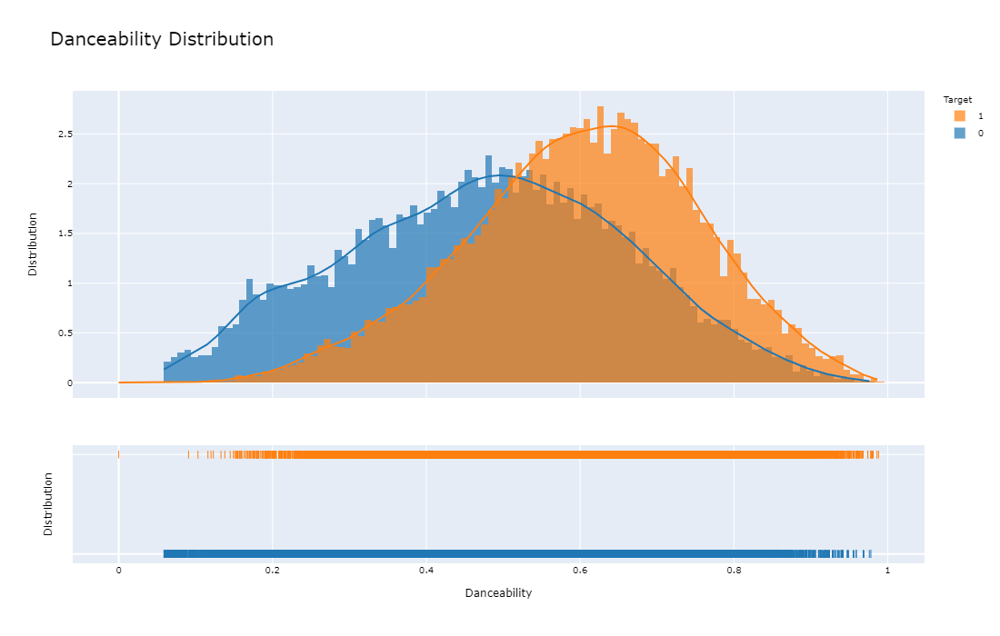

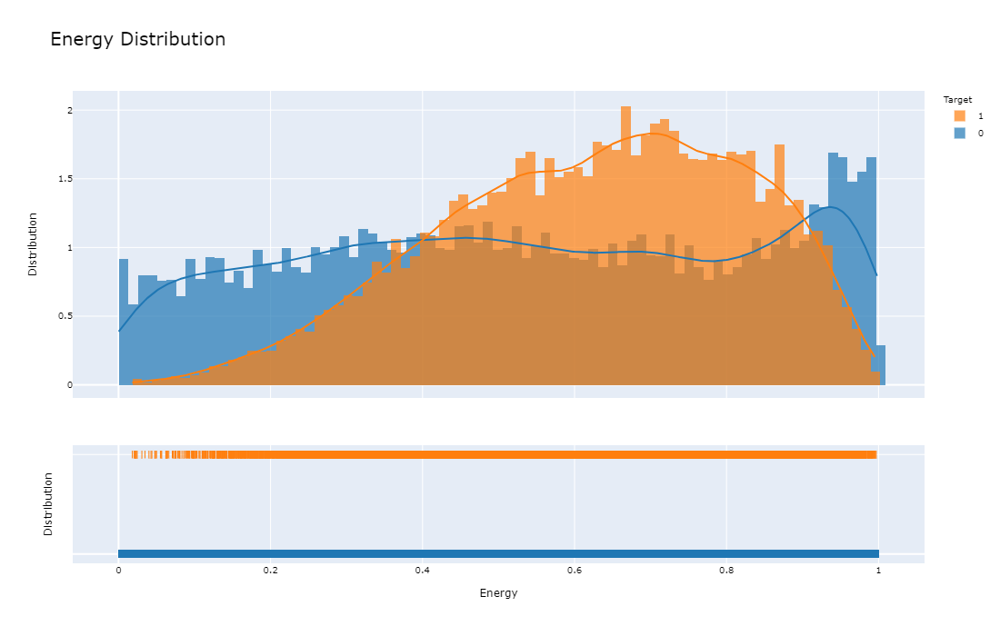

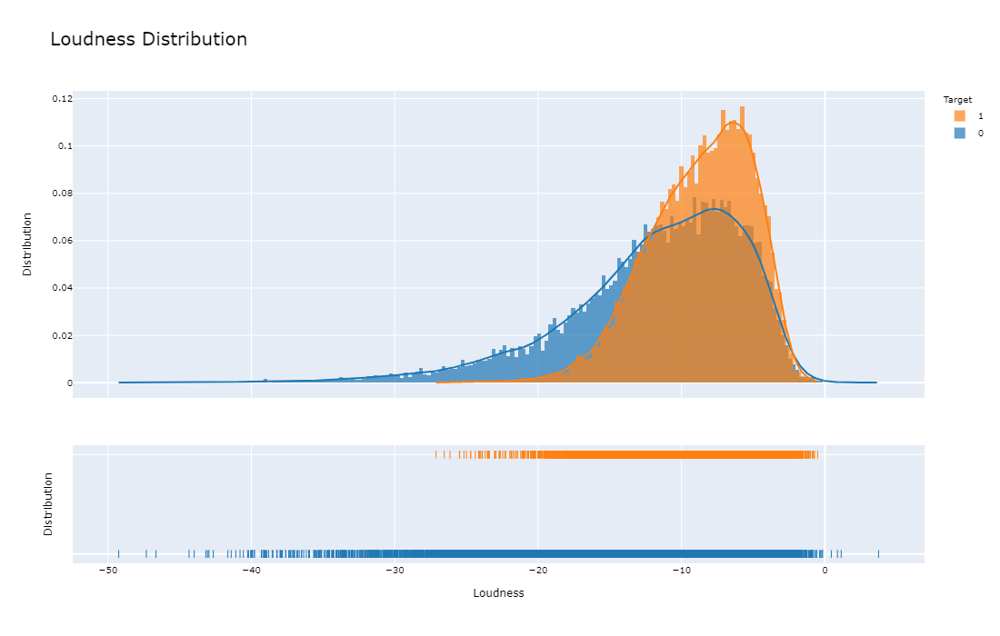

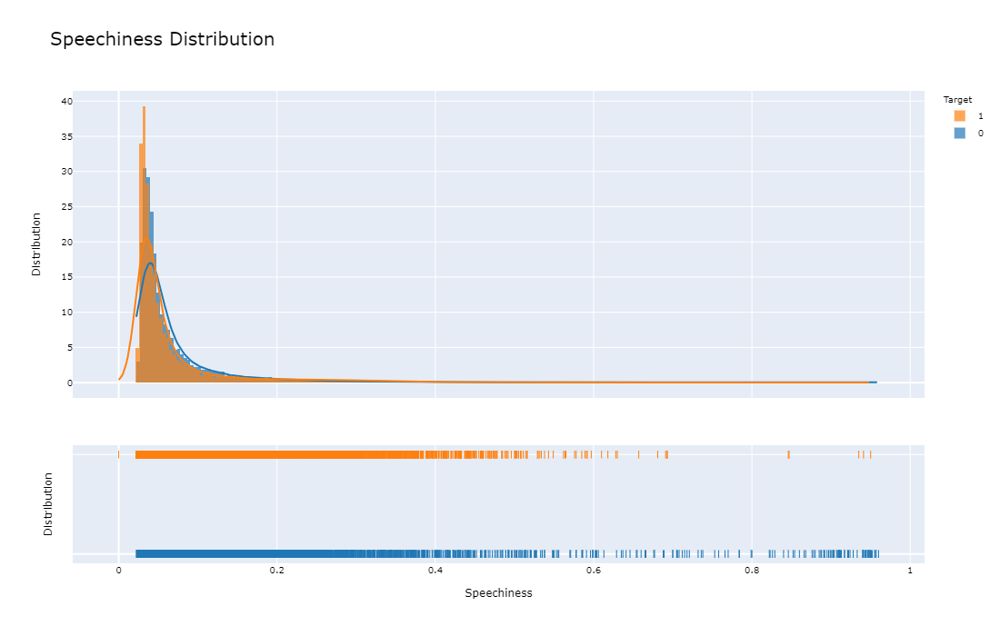

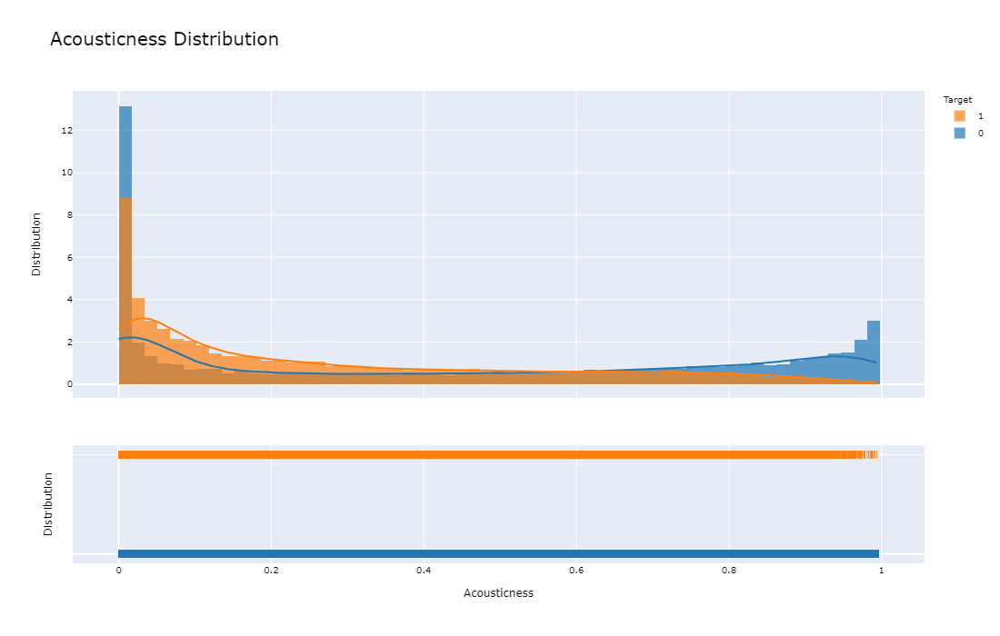

...

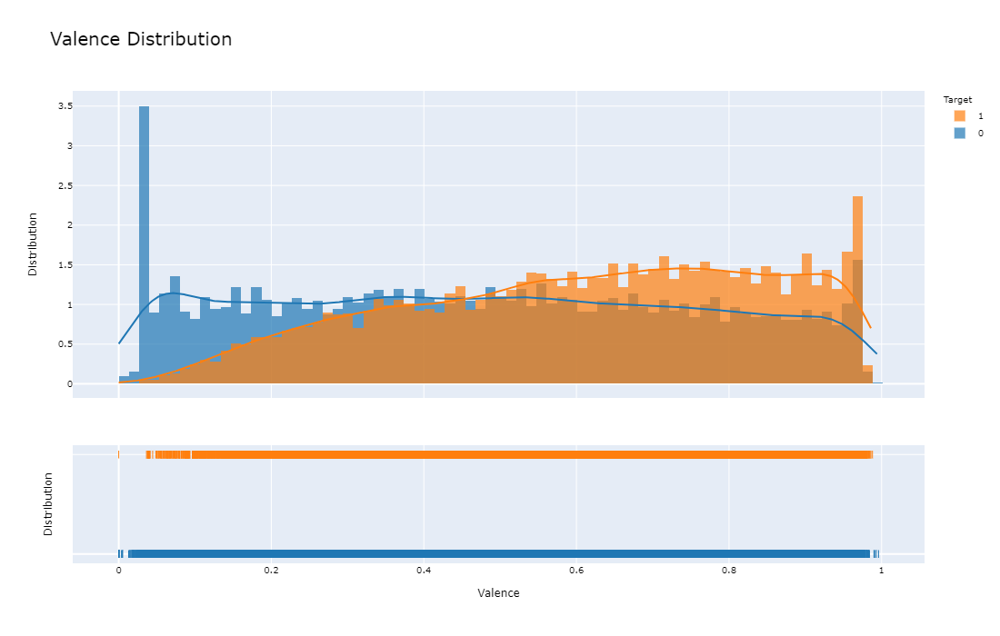

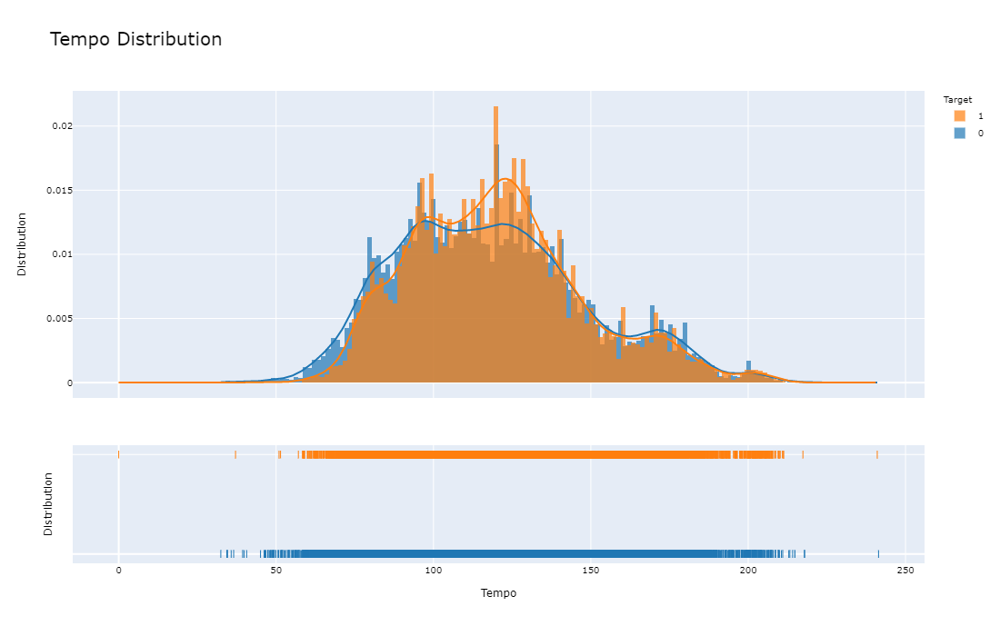

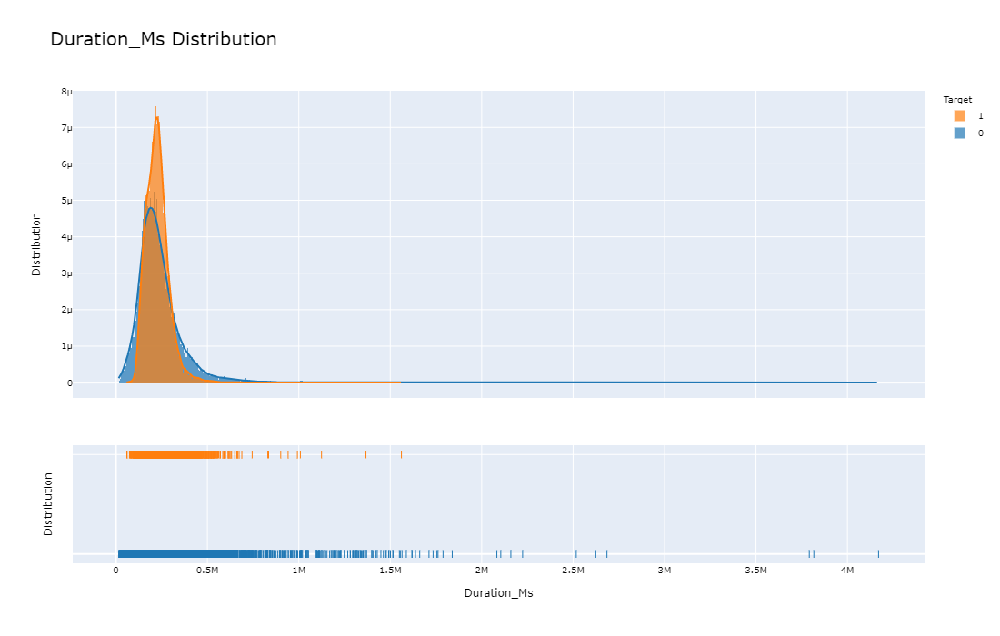

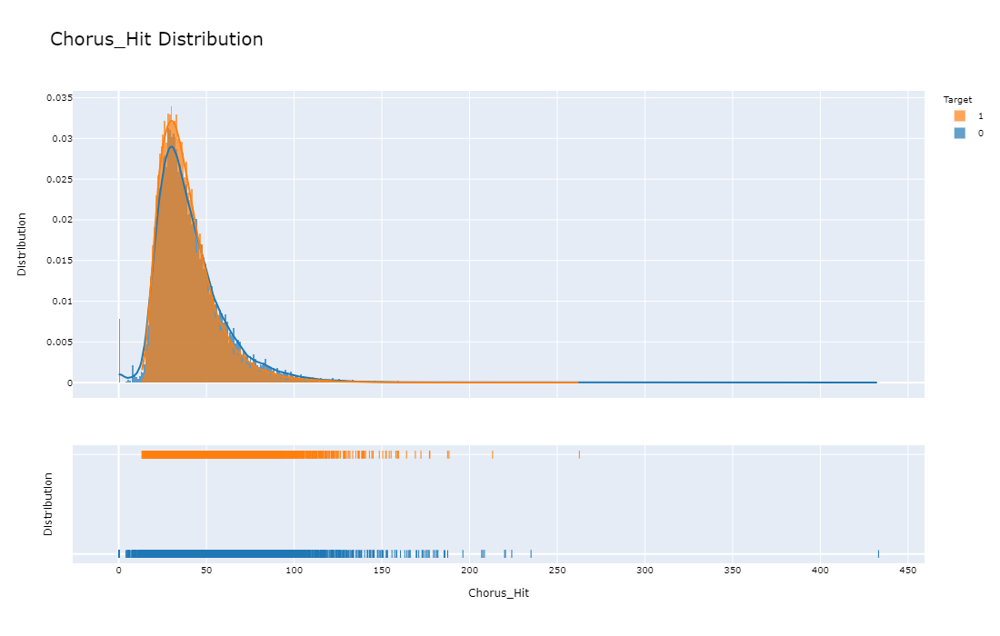

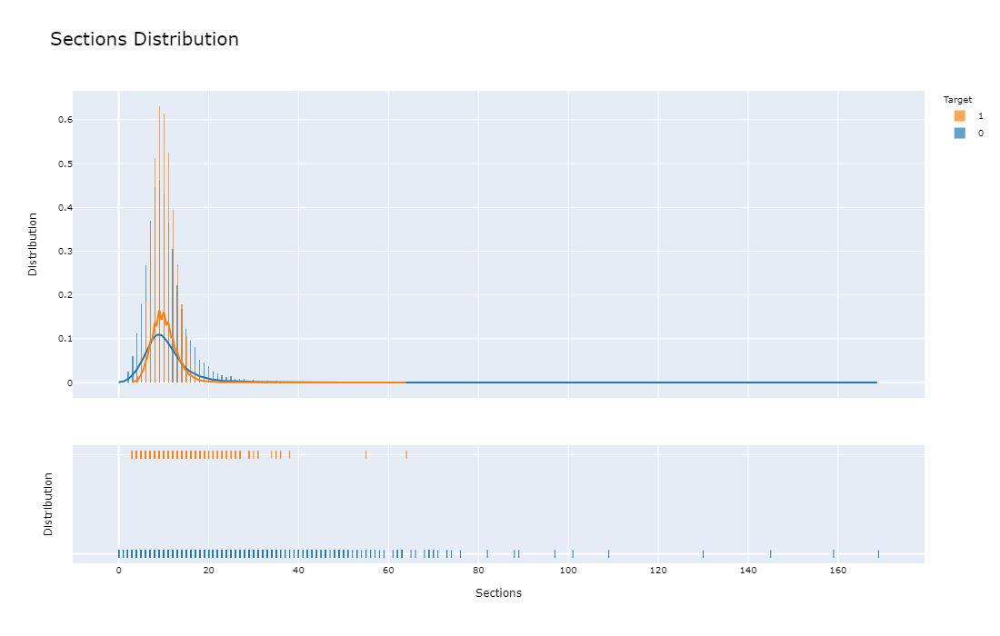

In [15]:
#More Danceable = More likely to be a hit
#More Energy = More likely to be a hit, extreme energy means less likely (Perhaps upbeat pop vs. dance)
#Louder = More likely to be a hit - Traditionally, louder mixes are sought after in the industry
#More Speechy = Less likely to be a hit - Some may not actually be songs
#More Acoustic = Less Likely to be a hit - Test relationship with other vars
#More Instrumental/Less Wordy Songs = Less likely to be a hit
#Liveness is fairly even across Hit vs. No hit
#More Valence = Hit, People want to listen to happier songs, most of the time
#Mid-High tempo implies more likely to be a Hit
#Clear sweet spot for duration - Definitely makes sense listener attention span, radio conventions etc.

for Var in ContinuousVars:
    DistributionPlot(Train, Var)

## Testing combined variable impact on Target

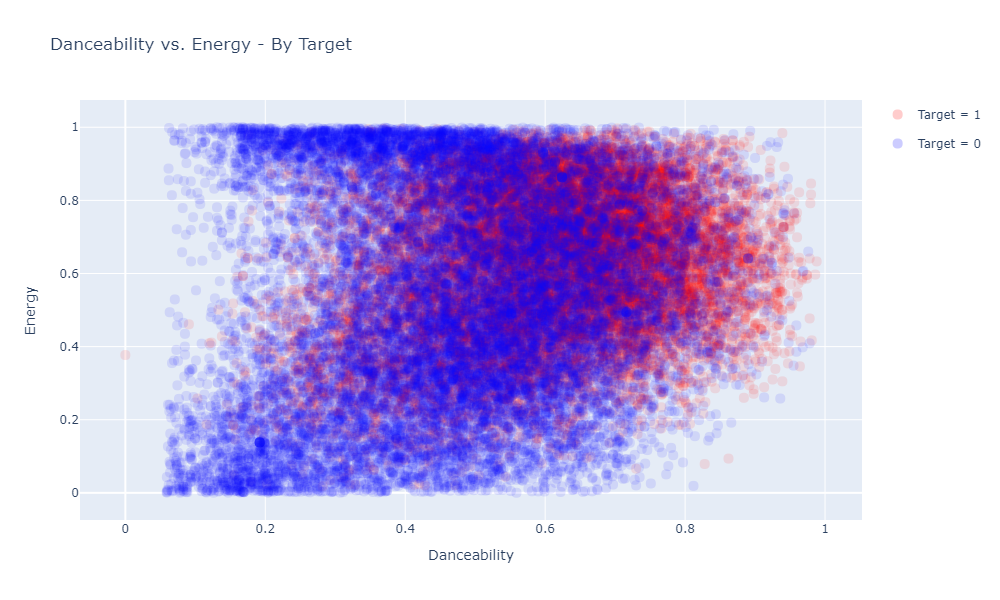

In [16]:
#Songs that become hits tend to be more danceable and have higher energy.
#Danceability and Energy possibly correlated?
#Danceability definitely correlates well with the target.
#High Energy but undanceable songs less likely to be a hit, maybe particular Rock/Metal genres?
Scatter(Train, "Danceability", "Target", "Energy", "Danceability vs. Energy - By Target")

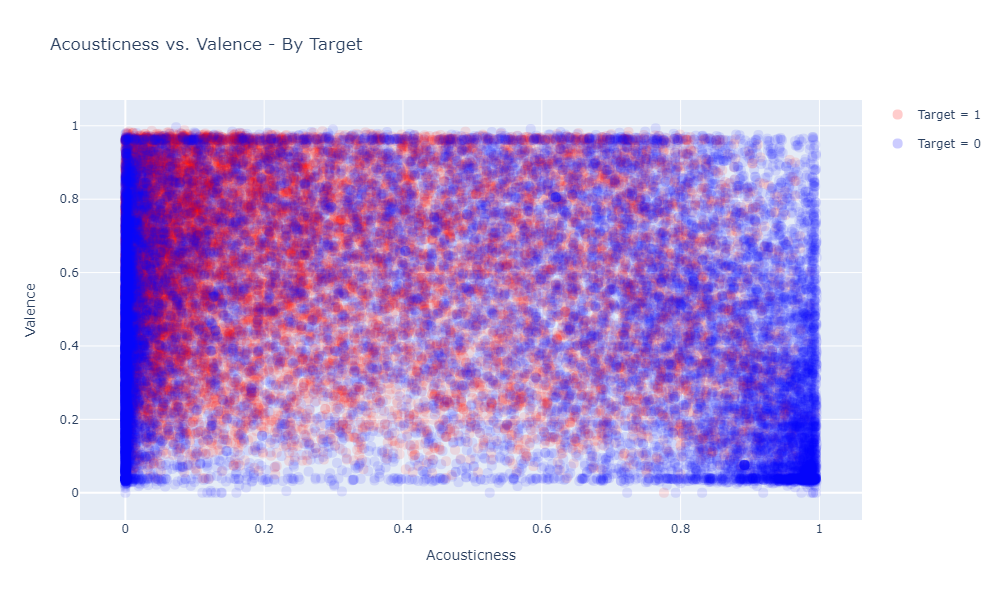

In [17]:
#Very Acoustic Songs that are also sad are not likely to be hits
Scatter(Train, "Acousticness", "Target", "Valence", "Acousticness vs. Valence - By Target")

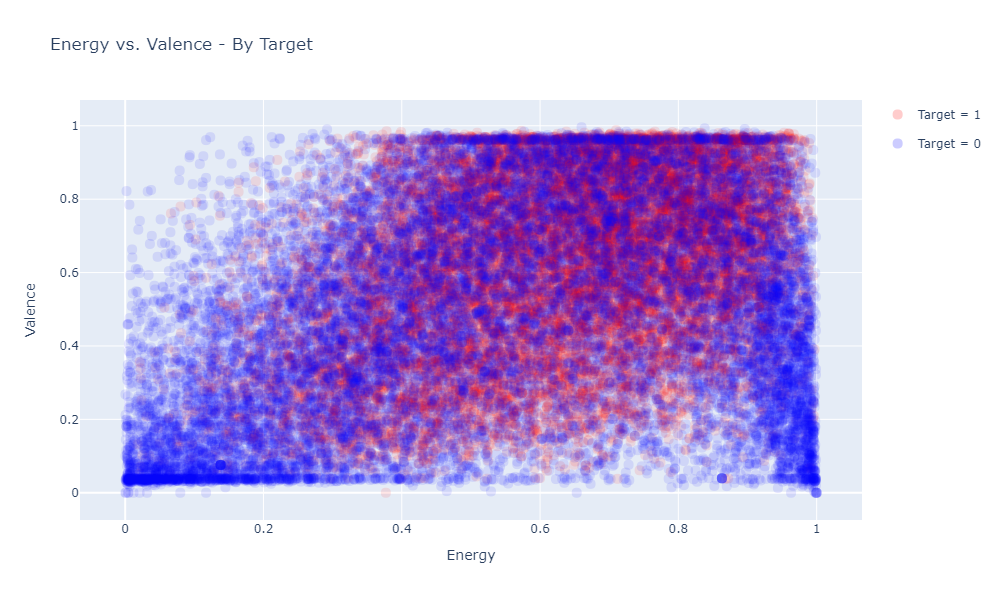

In [18]:
#Positive songs tend to make better hits than negative songs.
Scatter(Train, "Energy", "Target", "Valence", "Energy vs. Valence - By Target")

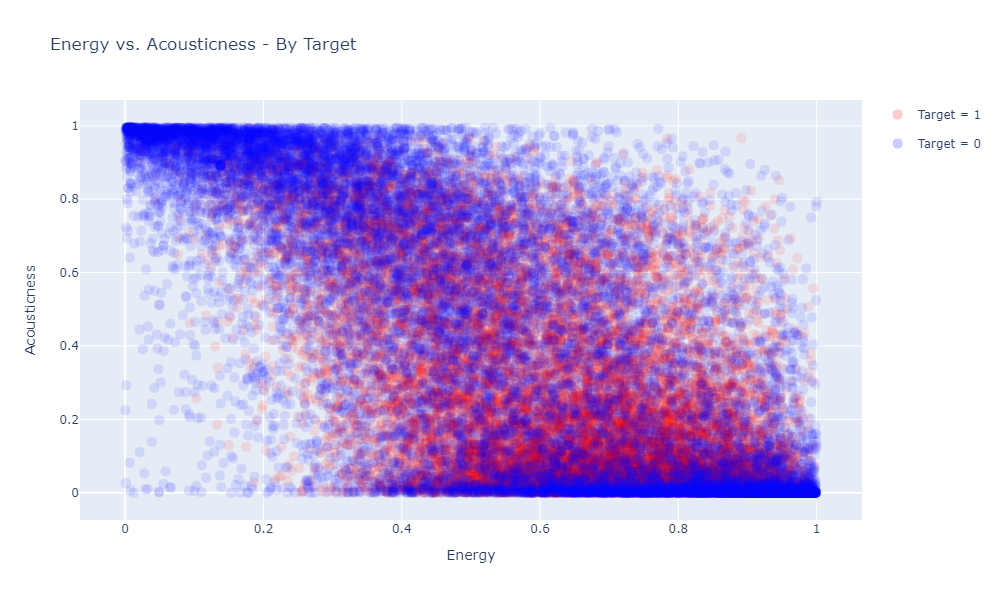

In [19]:
# Low energy Acoustic Songs tend to be Flops
Scatter(Train, "Energy", "Target", "Acousticness", "Energy vs. Acousticness - By Target")

In [20]:
Train.columns.values

array(['Track', 'Artist', 'Uri', 'Danceability', 'Energy', 'Key',
       'Loudness', 'Mode', 'Speechiness', 'Acousticness',
       'Instrumentalness', 'Liveness', 'Valence', 'Tempo', 'Duration_Ms',
       'Time_Signature', 'Chorus_Hit', 'Sections', 'Target', 'Decade',
       'LowEnergy', 'Acoustic', 'FourFour', 'Population'], dtype=object)

## Bin Variables and Clean

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




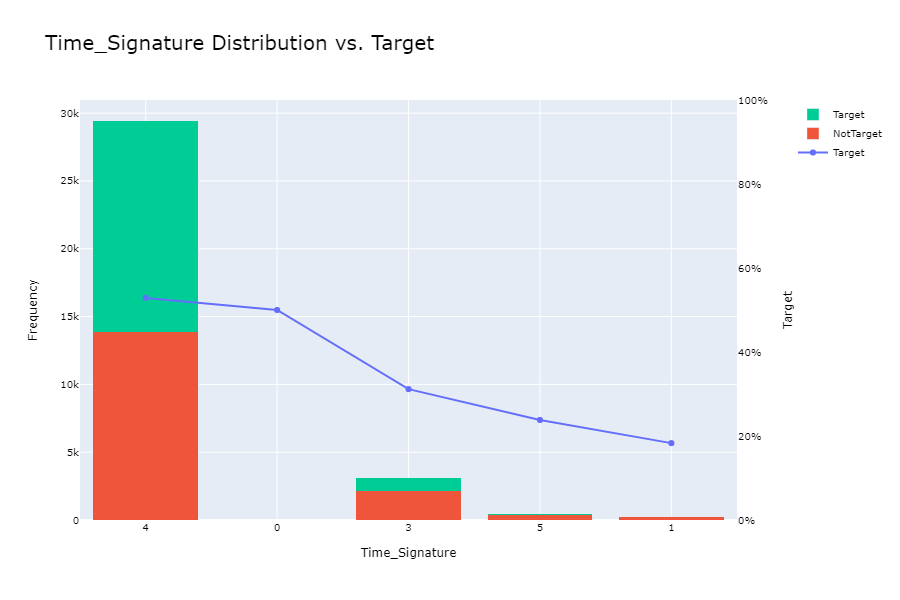

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




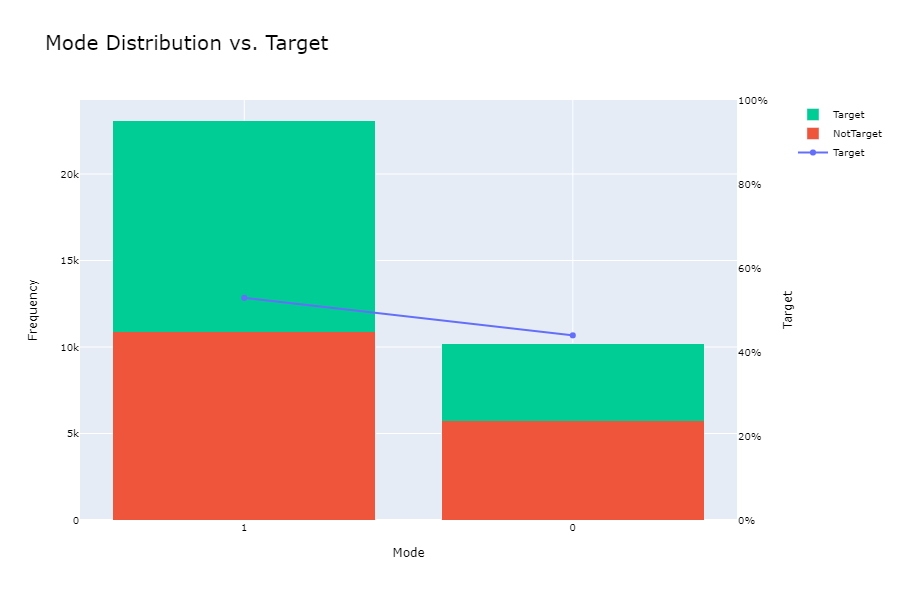

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




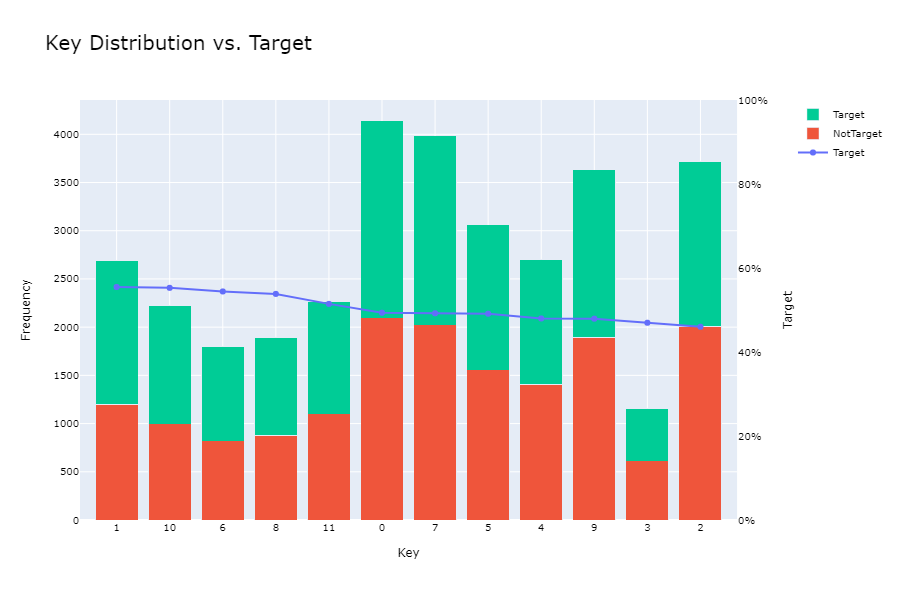

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




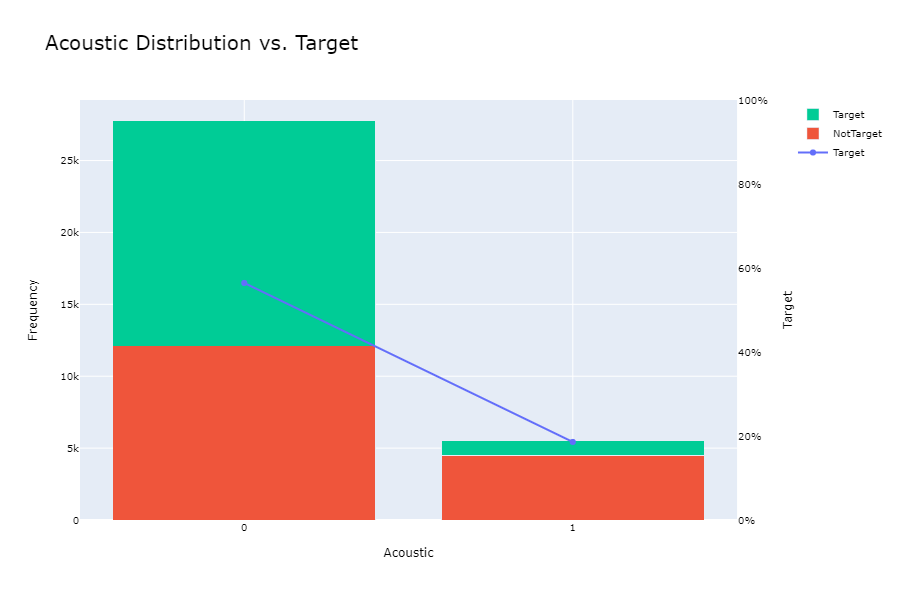

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




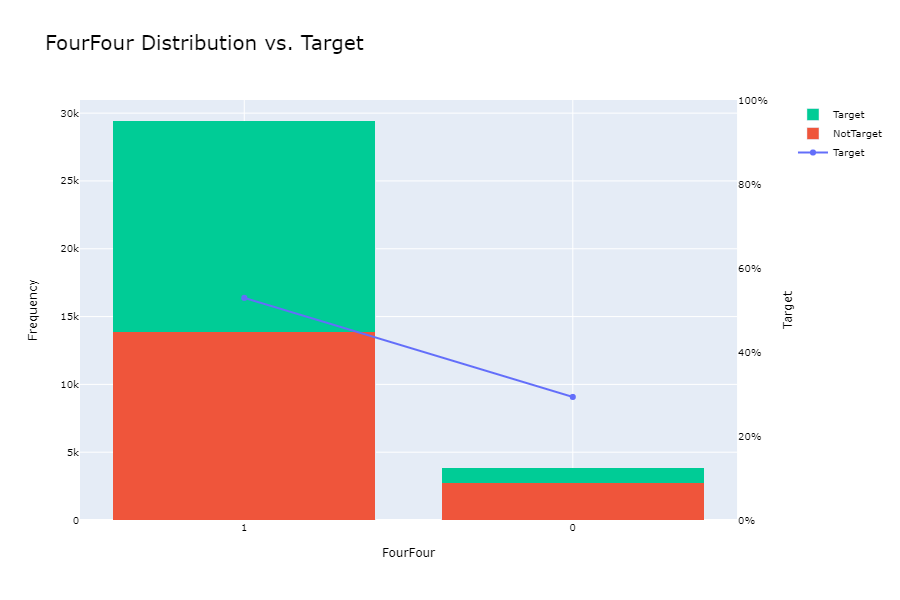

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




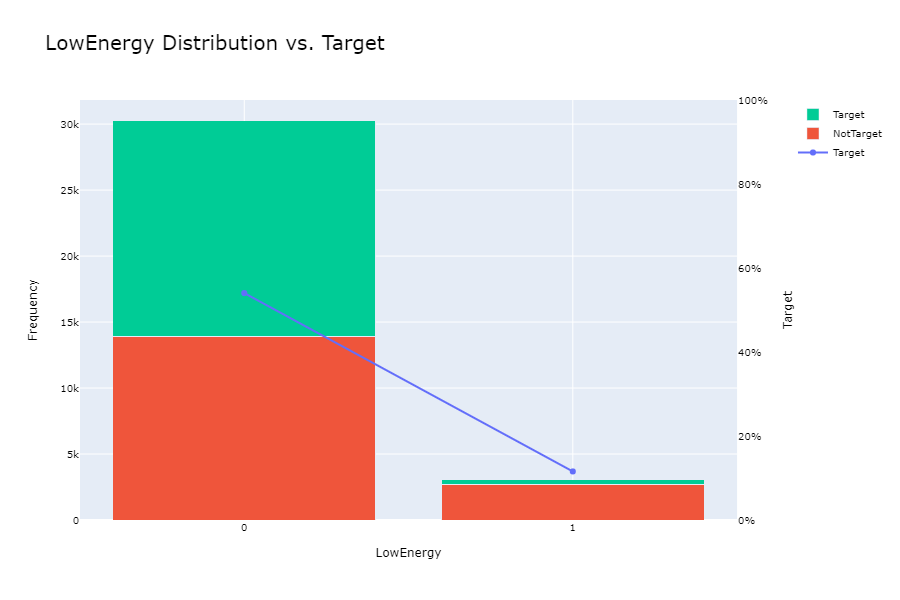

In [21]:
#4:4 Seems to be the favourable/most common time signature
#Mode
#Ordinally Encode Key
for Variable in DiscreteVars:
    Distribution(Train, "Target", Variable)

OPTIMAL
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.39529215
    IV (Jeffrey)             0.63415223
    JS (Jensen-Shannon)      0.06876380
    HHI                      0.03621163
    HHI (normalized)         0.00867482
    Cramer's V               0.35543926
    Quality score            0.00000000

  Significance tests

     Bin A  Bin B  t-statistic   p-value      P[A > B]  P[B > A]
         0      1    19.762085  0.000009  7.531233e-07  0.999999
         1      2     2.817848  0.093221  4.535302e-02  0.954647
         2      3    13.047330  0.000304  1.012114e-04  0.999899
         3      4     0.435397  0.509352  2.526241e-01  0.747376
         4      5     3.802880  0.051165  2.375566e-02  0.976244
         5      6     0.210450  0.646415  3.252512e-01  0.674749
         6      7     0.742303  0.388924  1.921086e-01  0.807891
         7 

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




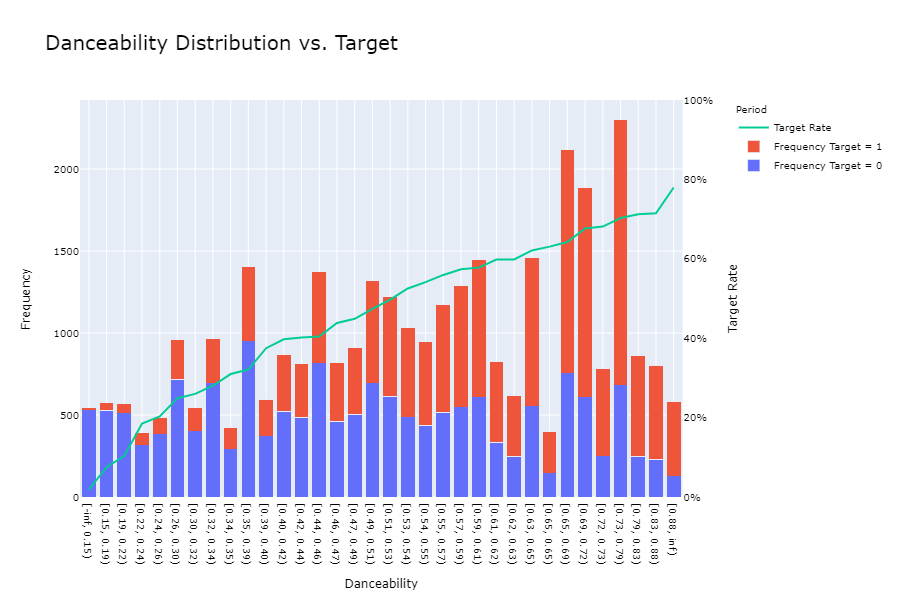

FEASIBLE
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.37392499
    IV (Jeffrey)             0.67294608
    JS (Jensen-Shannon)      0.07108465
    HHI                      0.03910959
    HHI (normalized)         0.01508733
    Cramer's V               0.35834054
    Quality score            0.00000000

  Significance tests

     Bin A  Bin B  t-statistic   p-value  P[A > B]      P[B > A]
         0      1     0.925091  0.336142  0.167998  8.320016e-01
         1      2     6.116225  0.013395  0.004725  9.952751e-01
         2      3     1.892955  0.168869  0.085378  9.146220e-01
         3      4     3.963441  0.046499  0.021302  9.786983e-01
         4      5     6.132530  0.013272  0.005800  9.942003e-01
         5      6     0.840116  0.359364  0.181220  8.187804e-01
         6      7     1.342971  0.246511  0.121086  8.789143e-01
         7

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




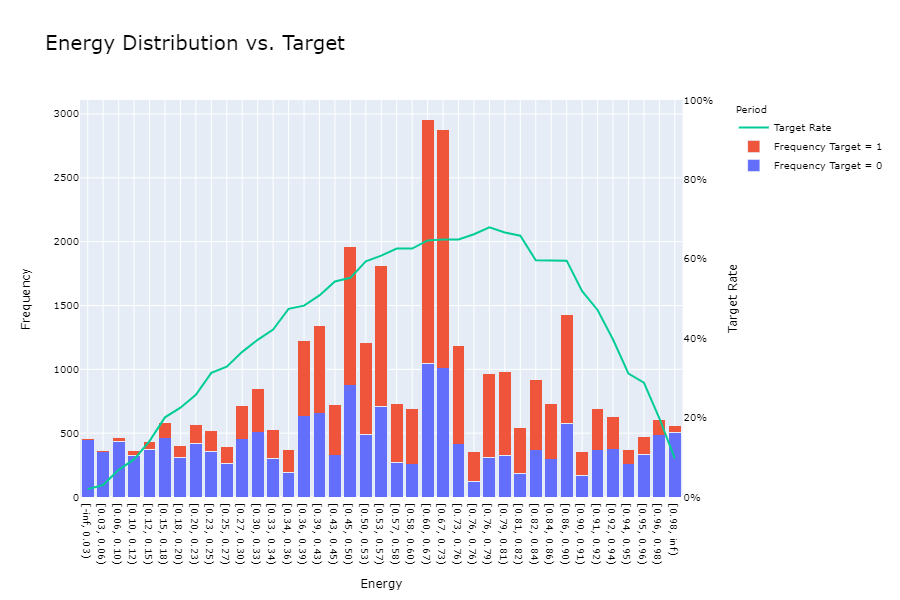

OPTIMAL
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.28922940
    IV (Jeffrey)             0.59001928
    JS (Jensen-Shannon)      0.05523269
    HHI                      0.11308002
    HHI (normalized)         0.07612502
    Cramer's V               0.31003100
    Quality score            0.00003612

  Significance tests

     Bin A  Bin B  t-statistic   p-value      P[A > B]  P[B > A]
         0      1    19.186569  0.000012  2.021539e-07  1.000000
         1      2     9.688159  0.001855  9.293650e-04  0.999071
         2      3     3.704517  0.054265  2.629800e-02  0.973702
         3      4     1.183693  0.276606  1.379105e-01  0.862090
         4      5     5.652700  0.017429  7.856578e-03  0.992143
         5      6     1.785787  0.181440  8.801038e-02  0.911990
         6      7     5.840473  0.015662  7.630442e-03  0.992370
         7 

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




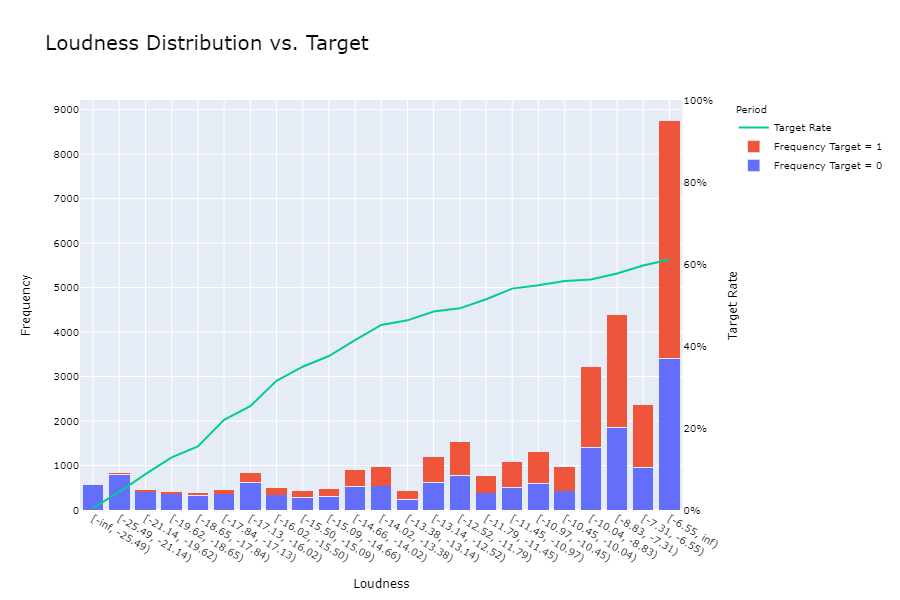

OPTIMAL
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.16338741
    IV (Jeffrey)             0.13424936
    JS (Jensen-Shannon)      0.01624707
    HHI                      0.38933513
    HHI (normalized)         0.35116857
    Cramer's V               0.17755708
    Quality score            0.00038761

  Significance tests

     Bin A  Bin B  t-statistic   p-value  P[A > B]      P[B > A]
         0      1     3.959128  0.046618  0.978619  2.138097e-02
         1      2     2.855797  0.091045  0.954936  4.506365e-02
         2      3     2.593313  0.107316  0.945506  5.449388e-02
         3      4     1.259893  0.261671  0.871867  1.281330e-01
         4      5     0.472819  0.491693  0.754012  2.459876e-01
         5      6     2.066084  0.150608  0.925003  7.499711e-02
         6      7     6.351498  0.011728  0.994416  5.584362e-03
         7 

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




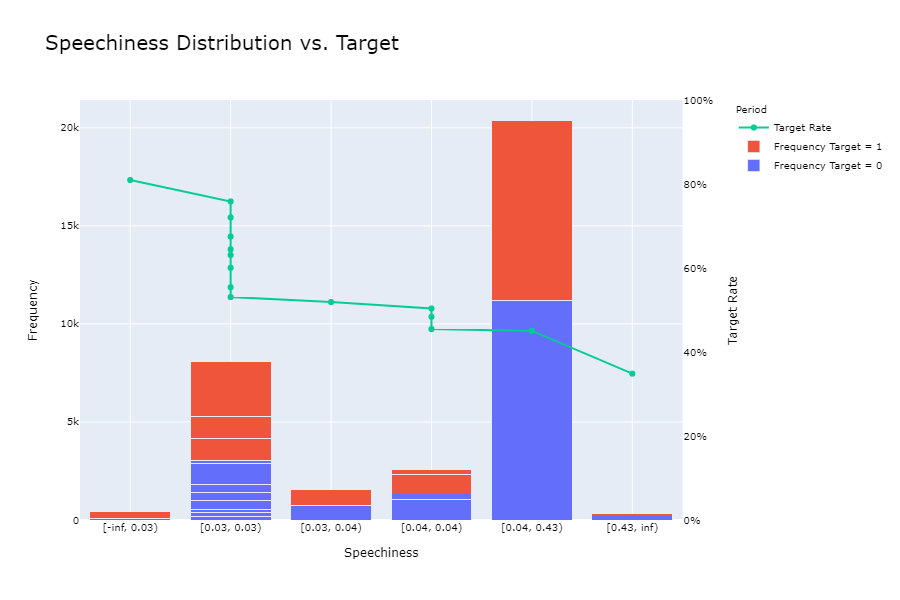

FEASIBLE
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.44938928
    IV (Jeffrey)             0.97989671
    JS (Jensen-Shannon)      0.09633332
    HHI                      0.03234160
    HHI (normalized)         0.00930211
    Cramer's V               0.41280380
    Quality score            0.00000000

  Significance tests

     Bin A  Bin B  t-statistic   p-value  P[A > B]  P[B > A]
         0      1     9.612580  0.001932  0.000648  0.999352
         1      2    17.757457  0.000025  0.000003  0.999997
         2      3    18.770911  0.000015  0.000002  0.999998
         3      4     4.086312  0.043232  0.020574  0.979426
         4      5     1.886062  0.169647  0.085304  0.914696
         5      6     7.272968  0.007000  0.003224  0.996776
         6      7     2.247229  0.133854  0.066776  0.933224
         7      8     2.940763  0.086370  

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




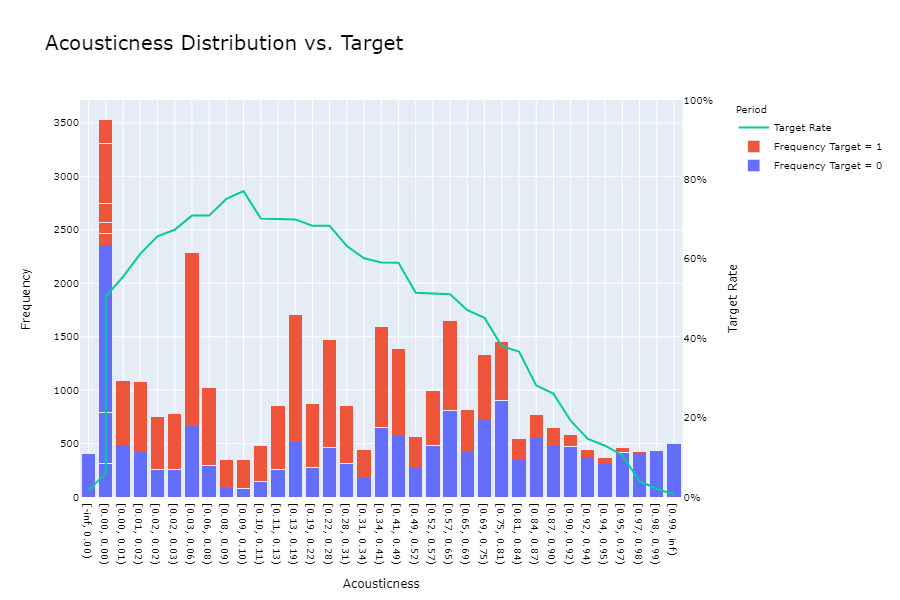

OPTIMAL
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.48070560
    IV (Jeffrey)             1.11024714
    JS (Jensen-Shannon)      0.11559887
    HHI                      0.11276480
    HHI (normalized)         0.07864037
    Cramer's V               0.45332257
    Quality score            0.00000111

  Significance tests

     Bin A  Bin B  t-statistic   p-value  P[A > B]      P[B > A]
         0      1    19.350255  0.000011  1.000000  2.144179e-07
         1      2     1.143900  0.284830  0.856439  1.435606e-01
         2      3     0.173617  0.676917  0.661478  3.385215e-01
         3      4     2.406867  0.120804  0.939905  6.009486e-02
         4      5     2.471631  0.115918  0.942722  5.727768e-02
         5      6     1.845069  0.174358  0.912889  8.711133e-02
         6      7     0.030301  0.861810  0.568796  4.312040e-01
         7 

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




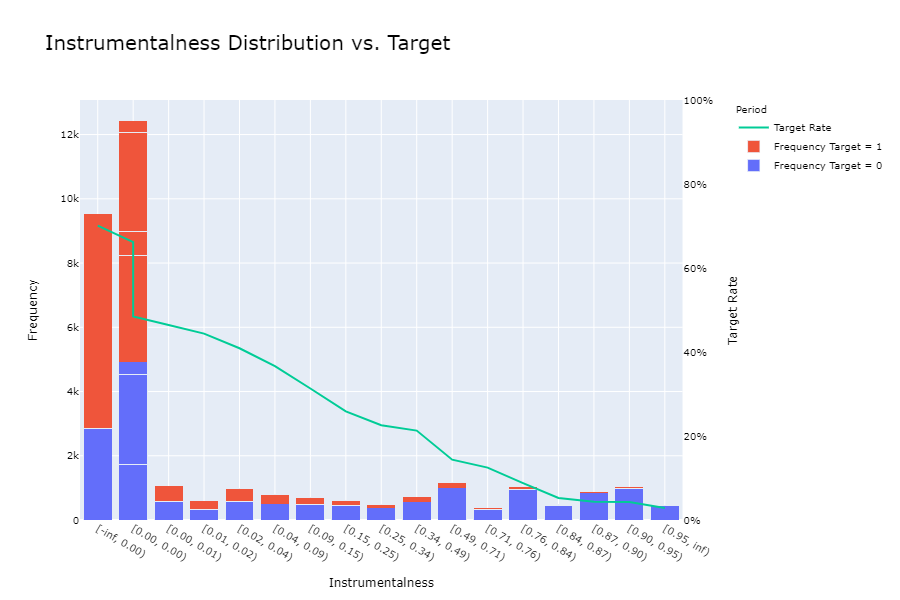

OPTIMAL
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.09157450
    IV (Jeffrey)             0.05011052
    JS (Jensen-Shannon)      0.00617047
    HHI                      0.41236637
    HHI (normalized)         0.37039254
    Cramer's V               0.11025506
    Quality score            0.00034124

  Significance tests

     Bin A  Bin B  t-statistic   p-value  P[A > B]      P[B > A]
         0      1     1.818217  0.177526  0.913731  8.626922e-02
         1      2     0.442299  0.506015  0.748254  2.517458e-01
         2      3     2.034786  0.153736  0.922208  7.779214e-02
         3      4     0.337708  0.561155  0.720202  2.797978e-01
         4      5     1.563917  0.211093  0.894171  1.058295e-01
         5      6     0.960985  0.326939  0.837472  1.625283e-01
         6      7     0.058123  0.809488  0.595478  4.045217e-01
         7 

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




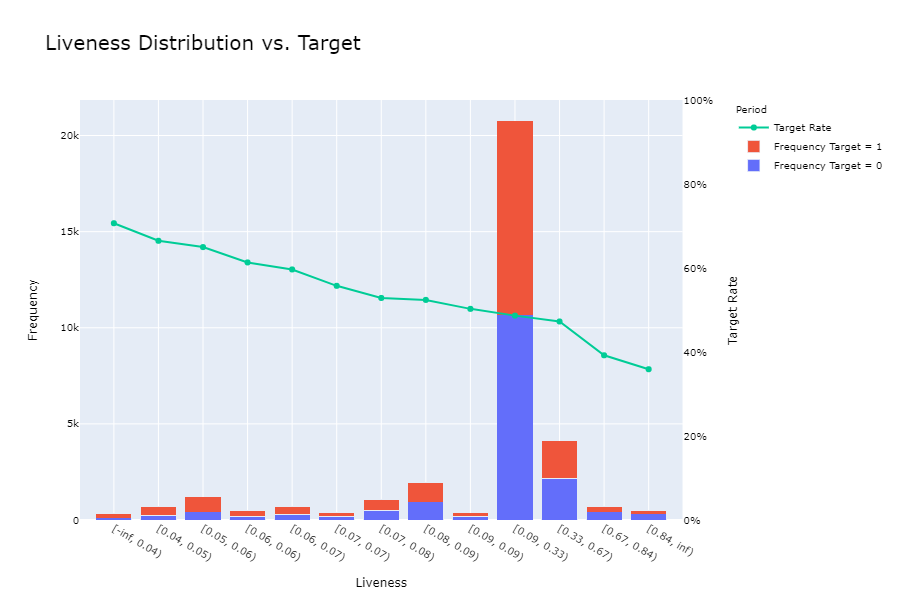

OPTIMAL
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.27876729
    IV (Jeffrey)             0.50930083
    JS (Jensen-Shannon)      0.04685031
    HHI                      0.06293461
    HHI (normalized)         0.02034073
    Cramer's V               0.28596515
    Quality score            0.00000098

  Significance tests

     Bin A  Bin B  t-statistic       p-value      P[A > B]  P[B > A]
         0      1    10.521472  1.179955e-03  1.598139e-04  0.999840
         1      2    17.534054  2.822075e-05  2.824300e-06  0.999997
         2      3    54.943781  1.240272e-13  8.157866e-17  1.000000
         3      4     8.656454  3.259049e-03  1.393019e-03  0.998607
         4      5     3.996320  4.559973e-02  2.167142e-02  0.978329
         5      6     9.117839  2.531288e-03  1.078098e-03  0.998922
         6      7     1.275763  2.586883e-01  1.

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




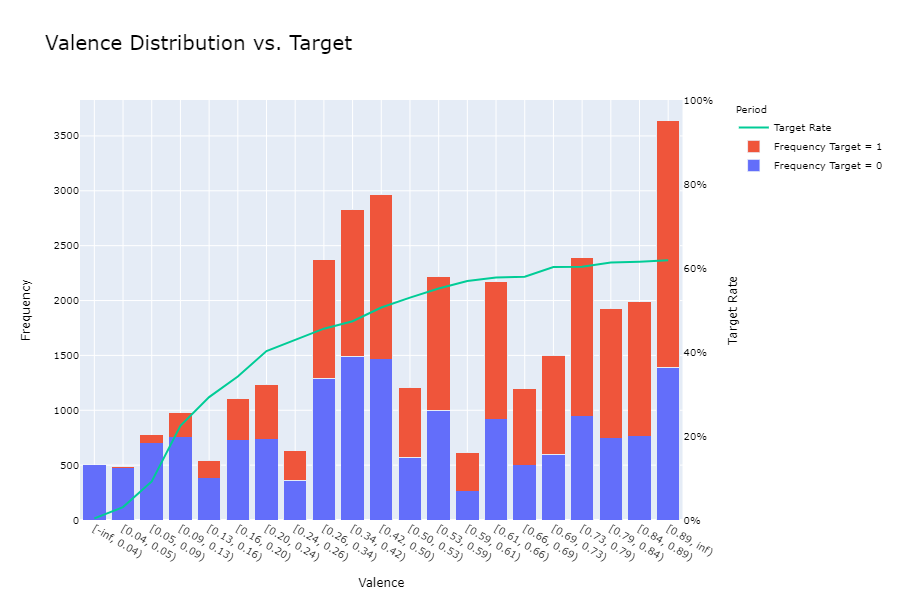

FEASIBLE
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.10930083
    IV (Jeffrey)             0.05795288
    JS (Jensen-Shannon)      0.00695514
    HHI                      0.08353898
    HHI (normalized)         0.03262448
    Cramer's V               0.11593172
    Quality score            0.00009913

  Significance tests

     Bin A  Bin B  t-statistic   p-value  P[A > B]  P[B > A]
         0      1    20.317328  0.000007  0.000001  0.999999
         1      2    18.001998  0.000022  0.000003  0.999997
         2      3     0.011305  0.915324  0.456342  0.543658
         3      4     4.703443  0.030102  0.014595  0.985405
         4      5     1.223541  0.268667  0.134218  0.865782
         5      6     0.456772  0.499137  0.249479  0.750521
         6      7     0.150377  0.698175  0.349029  0.650971
         7      8     9.695768  0.001847  

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




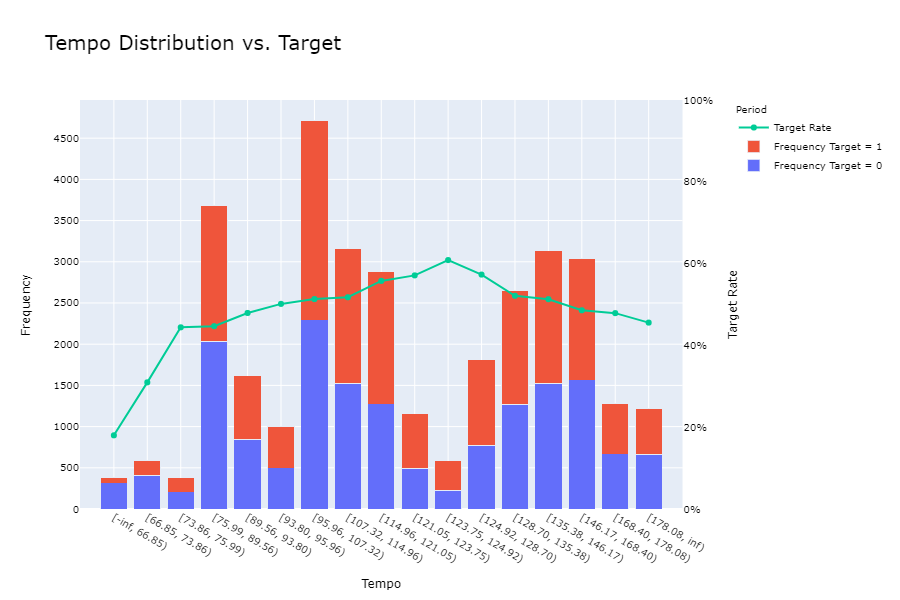

FEASIBLE
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.29083813
    IV (Jeffrey)             0.52533660
    JS (Jensen-Shannon)      0.05059133
    HHI                      0.05644154
    HHI (normalized)         0.02498960
    Cramer's V               0.29824849
    Quality score            0.00000006

  Significance tests

     Bin A  Bin B  t-statistic       p-value      P[A > B]      P[B > A]
         0      1     6.450171  1.109416e-02  2.204100e-03  9.977959e-01
         1      2    31.377629  2.124143e-08  2.710065e-10  1.000000e+00
         2      3    52.815795  3.663433e-13  1.858071e-17  1.000000e+00
         3      4    12.847426  3.379438e-04  1.317539e-04  9.998682e-01
         4      5     7.886547  4.980385e-03  2.252722e-03  9.977473e-01
         5      6     0.509439  4.753819e-01  2.375202e-01  7.624798e-01
         6      7  

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




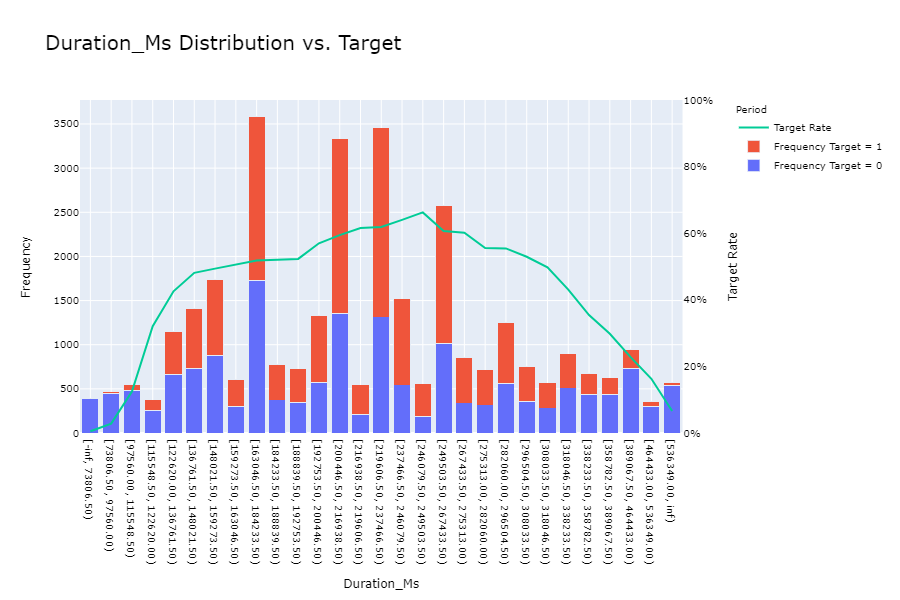

OPTIMAL
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.02129452
    IV (Jeffrey)             0.03663028
    JS (Jensen-Shannon)      0.00388954
    HHI                      0.93064498
    HHI (normalized)         0.91677397
    Cramer's V               0.08278574
    Quality score            0.00863563

  Significance tests

     Bin A  Bin B  t-statistic       p-value      P[A > B]  P[B > A]
         0      1    91.376220  1.187955e-21  7.231713e-30  1.000000
         1      2     1.630335  2.016567e-01  9.999886e-02  0.900001
         2      3     2.127419  1.446842e-01  7.219739e-02  0.927803

None


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




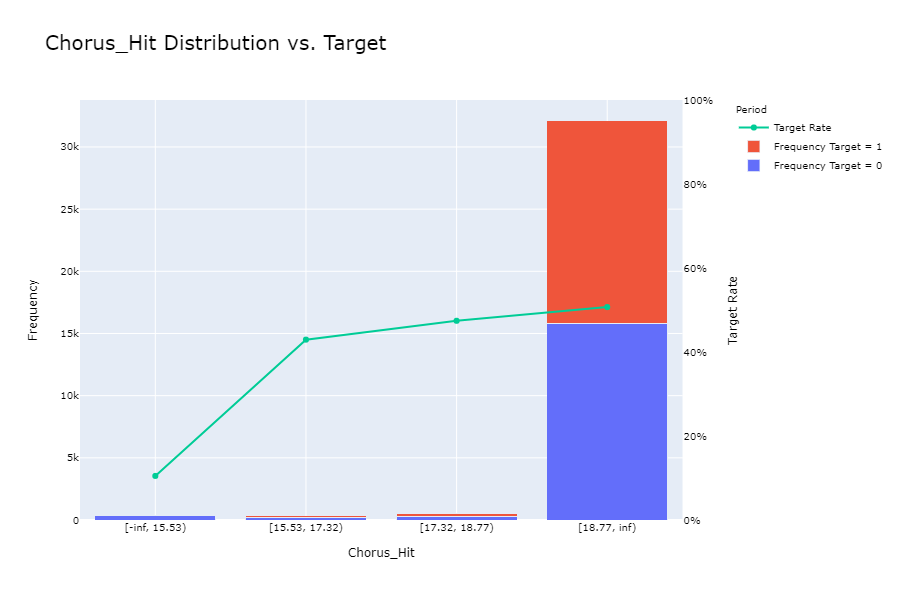

OPTIMAL
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.23416178
    IV (Jeffrey)             0.32948072
    JS (Jensen-Shannon)      0.03565075
    HHI                      0.08942931
    HHI (normalized)         0.04150453
    Cramer's V               0.25426952
    Quality score            0.07173043

  Significance tests

     Bin A  Bin B  t-statistic       p-value      P[A > B]      P[B > A]
         0      1    14.345647  1.521310e-04  3.038140e-05  9.999696e-01
         1      2    48.937782  2.642119e-12  1.381852e-14  1.000000e+00
         2      3    48.318224  3.623689e-12  6.009002e-14  1.000000e+00
         3      4    33.554647  6.928965e-09  5.547756e-10  1.000000e+00
         4      5    11.623327  6.512980e-04  2.603747e-04  9.997396e-01
         5      6    15.629897  7.702705e-05  2.208167e-05  9.999779e-01
         6      7   

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




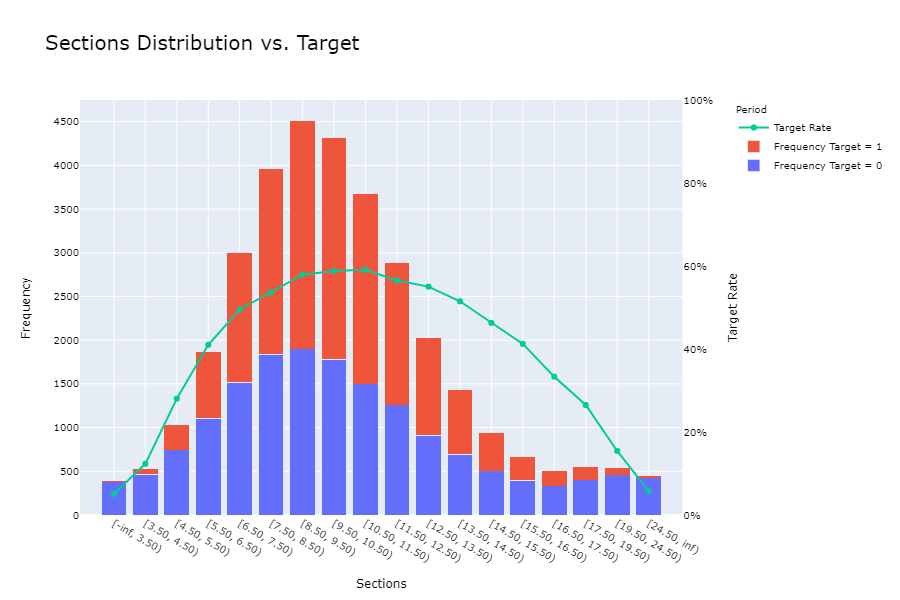

In [22]:
BinOut = {}

for Variable in ContinuousVars:
    BinOut = BinVariable(Train, "Target", Variable, BinOut, Trend="auto")

In [23]:
Variables = ["Mode", "Acoustic", "FourFour", "LowEnergy", "Liveness", "Instrumentalness", "Danceability"]

SquareVariables = ["Loudness", "Duration_Ms", "Energy", "Acousticness", "Tempo", "Sections", "Chorus_Hit"]

SqrtVariables = ["Valence"]

OrdinalVariables = ["Key"]

ModVars = Variables+SquareVariables+SqrtVariables+OrdinalVariables
ModVarsClean = [str(Variable)+"Clean" for Variable in ModVars]

In [24]:
for Variable in ModVars:
    Train[Variable+"Clean"] = Train[Variable]
    Test[Variable+"Clean"] = Test[Variable]

In [25]:
for Variable in ContinuousVars:
    
    Bins = BinOut[Variable].tolist()
    Bins.insert(0, -np.inf)
    Bins.insert(len(Bins), np.inf)
    
    Train[Variable + "Clean"] = pd.cut(Train[Variable], bins=Bins, labels = range(0, len(Bins)-1)).values
    Test[Variable + "Clean"] = pd.cut(Test[Variable], bins=Bins, labels = range(0, len(Bins)-1)).values

In [26]:
for Variable in ModVarsClean:
    Train[Variable]  = pd.to_numeric(Train[Variable])
    Test[Variable]  = pd.to_numeric(Test[Variable])

for Variable in SquareVariables:
    Train[str(Variable)+"SquaredClean"] = Train[Variable+"Clean"]**2
    Test[str(Variable)+"SquaredClean"] = Test[Variable+"Clean"]**2
    ModVarsClean.append(str(Variable)+"SquaredClean")
    
for Variable in SqrtVariables:
    Train[str(Variable)+"SqrtClean"] = Train[Variable+"Clean"]**0.5
    Test[str(Variable)+"SqrtClean"] = Test[Variable+"Clean"]**0.5
    ModVarsClean.append(str(Variable)+"SqrtClean")
    
for Variable in OrdinalVariables:
    Index = pd.pivot_table(Train, index=Variable, values="Target", aggfunc="mean").sort_values(by="Target", ascending=False).index.values
    Labels = {}
    for i in range(len(Index)):
        Labels[Index[i]] = i

    Train[str(Variable)+"Clean"] = Train.Key.map(Labels)
    Test[str(Variable)+"Clean"] = Test.Key.map(Labels)

                 Target
LoudnessClean          
0              0.005164
1              0.044418
2              0.087640
3              0.128329
4              0.155263
5              0.220044
6              0.253317
7              0.314928
8              0.349425
9              0.375519
10             0.414286
11             0.451382
12             0.462585
13             0.484007
14             0.491835
15             0.514103
16             0.539945
17             0.548092
18             0.558763
19             0.562286
20             0.576730
21             0.596528
22             0.610737
               Target
LoudnessClean        
0                 581
1                 833
2                 445
3                 413
4                 380
5                 459
6                 829
7                 489
8                 435
9                 482
10                910
11                977
12                441
13               1188
14               1531
15                780
16  

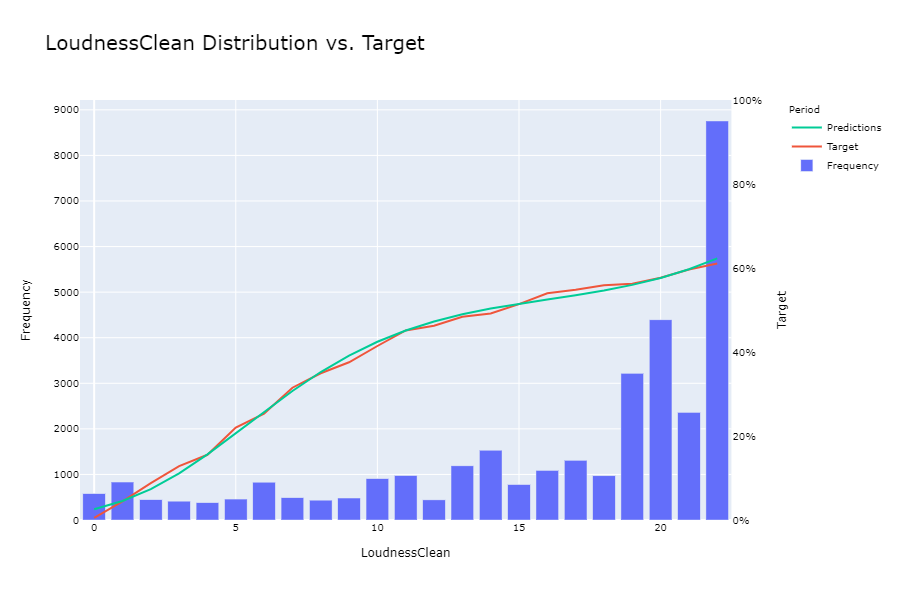

                    Target
Duration_MsClean          
0                 0.005141
1                 0.028139
2                 0.124314
3                 0.320856
4                 0.425347
5                 0.480878
6                 0.493664
7                 0.504967
8                 0.518281
9                 0.520619
10                0.522822
11                0.569601
12                0.594050
13                0.615809
14                0.618882
15                0.640079
16                0.662455
17                0.606672
18                0.601170
19                0.555245
20                0.554313
21                0.529255
22                0.497345
23                0.430804
24                0.354074
25                0.297907
26                0.227848
27                0.162921
28                0.066202
                  Target
Duration_MsClean        
0                    389
1                    462
2                    547
3                    374
4            

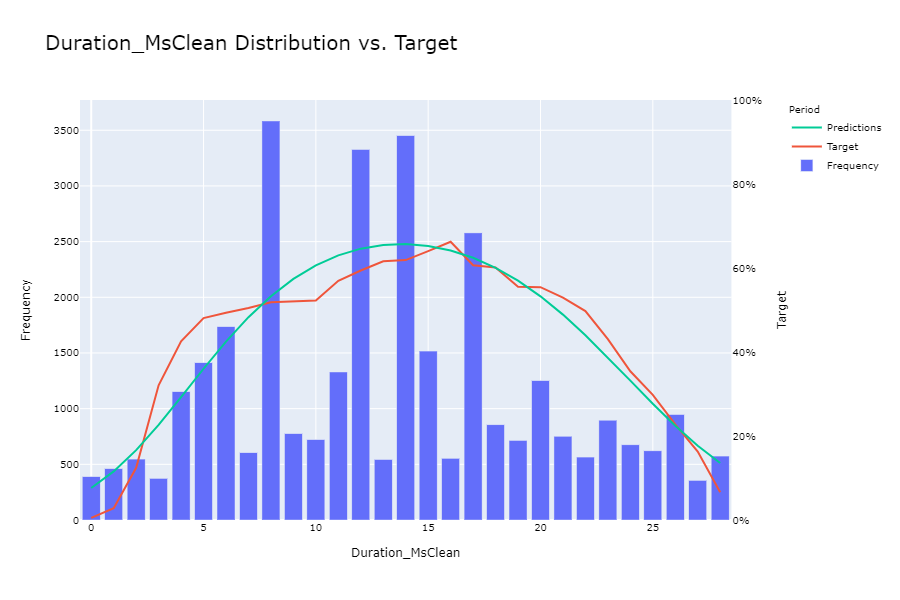

               Target
EnergyClean          
0            0.019780
1            0.030220
2            0.068522
3            0.094708
4            0.140878
5            0.200692
6            0.225000
7            0.257549
8            0.312741
9            0.328205
10           0.365546
11           0.395981
12           0.421756
13           0.474114
14           0.482026
15           0.507842
16           0.542936
17           0.552041
18           0.593543
19           0.608071
20           0.625860
21           0.625899
22           0.646242
23           0.648470
24           0.648649
25           0.661972
26           0.679128
27           0.666327
28           0.658088
29           0.596510
30           0.595628
31           0.595372
32           0.518414
33           0.471182
34           0.396800
35           0.310992
36           0.287846
37           0.198347
38           0.096774
             Target
EnergyClean        
0               455
1               364
2               46

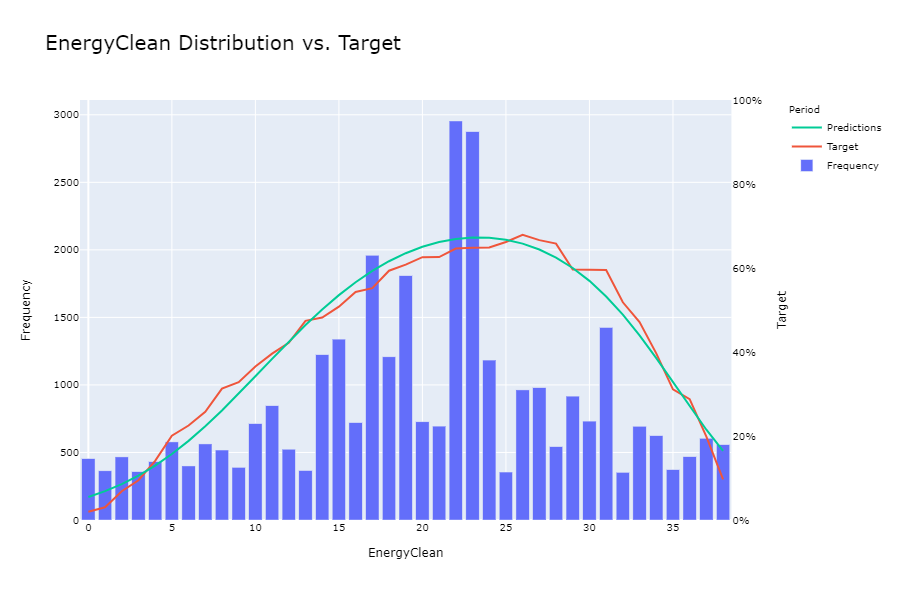

                     Target
AcousticnessClean          
0                  0.017157
1                  0.060060
2                  0.154529
3                  0.269634
4                  0.332083
5                  0.377581
6                  0.462354
7                  0.505747
8                  0.554228
9                  0.612396
10                 0.656458
11                 0.673077
12                 0.708789
13                 0.708824
14                 0.750725
15                 0.770538
16                 0.701245
17                 0.701055
18                 0.699297
19                 0.683180
20                 0.683027
21                 0.632009
22                 0.601351
23                 0.590680
24                 0.590223
25                 0.514235
26                 0.513131
27                 0.510909
28                 0.470443
29                 0.451201
30                 0.379808
31                 0.366483
32                 0.280884
33                 0

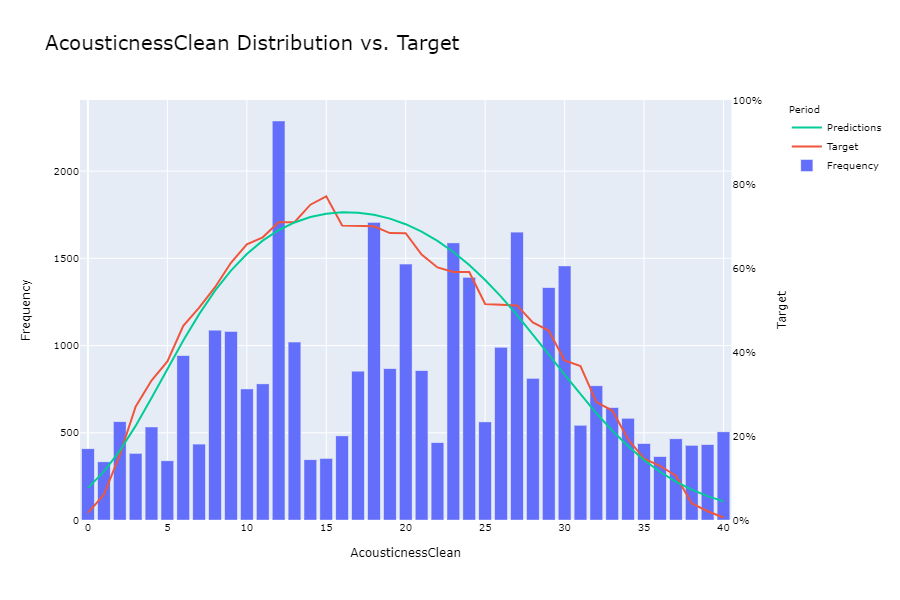

              Target
TempoClean          
0           0.180157
1           0.309645
2           0.444149
3           0.447011
4           0.479257
5           0.501499
6           0.513256
7           0.517710
8           0.557719
9           0.571181
10          0.608621
11          0.573164
12          0.521297
13          0.512927
14          0.485865
15          0.478906
16          0.455738
            Target
TempoClean        
0              383
1              591
2              376
3             3680
4             1615
5             1001
6             4715
7             3162
8             2876
9             1152
10             580
11            1811
12            2653
13            3133
14            3042
15            1280
16            1220
Optimization terminated successfully.
         Current function value: 0.657419
         Iterations 5


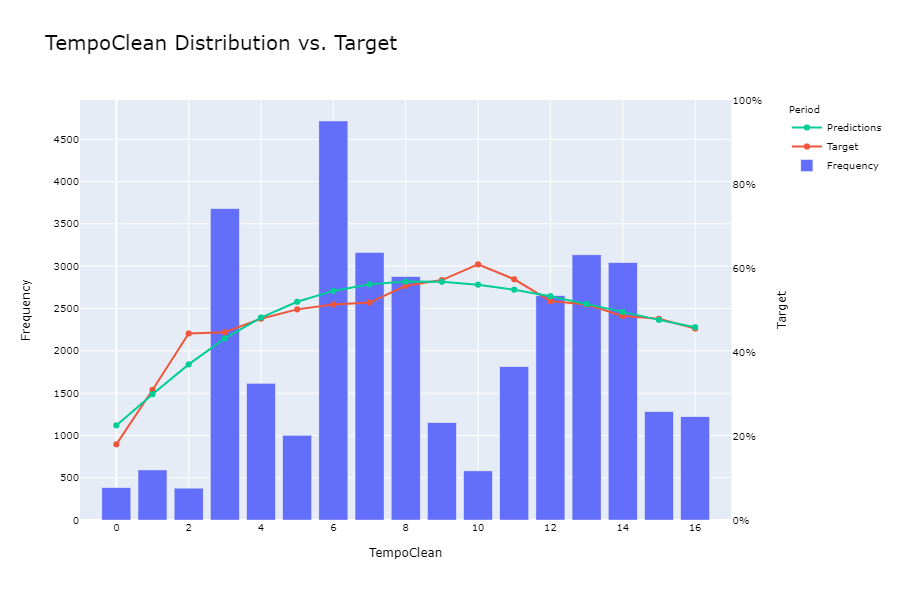

                 Target
SectionsClean          
0              0.050505
1              0.123340
2              0.280310
3              0.410064
4              0.495171
5              0.536400
6              0.579157
7              0.588140
8              0.591120
9              0.565202
10             0.550346
11             0.515024
12             0.462766
13             0.412294
14             0.333333
15             0.265082
16             0.154275
17             0.057778
               Target
SectionsClean        
0                 396
1                 527
2                1031
3                1868
4                3003
5                3956
6                4510
7                4317
8                3671
9                2891
10               2026
11               1431
12                940
13                667
14                501
15                547
16                538
17                450
Optimization terminated successfully.
         Current function value: 0.533545


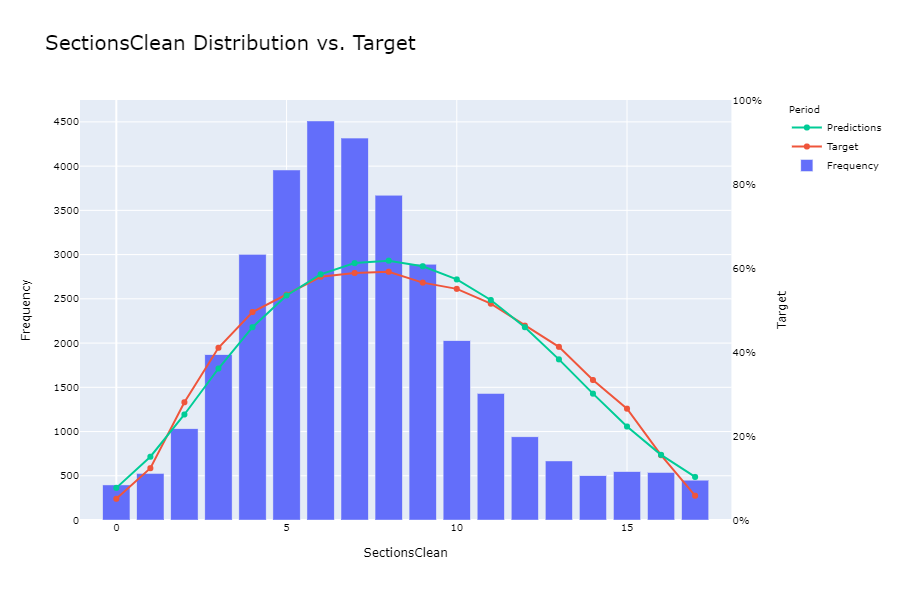

                   Target
Chorus_HitClean          
0                0.104956
1                0.429429
2                0.474308
3                0.506981
                 Target
Chorus_HitClean        
0                   343
1                   333
2                   506
3                 32088


PerfectSeparationError: Perfect separation detected, results not available

In [28]:
#Plot polynomial assumptions for verification
for Variable in SquareVariables: 
    BinPlot(Train, Variable+"Clean", "Target", Proof = "Square" if Variable in SquareVariables else "Cubed")

             Target
ModeClean          
-1.0       0.439643
 1.0       0.528963
           Target
ModeClean        
-1.0        10206
 1.0        23064


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




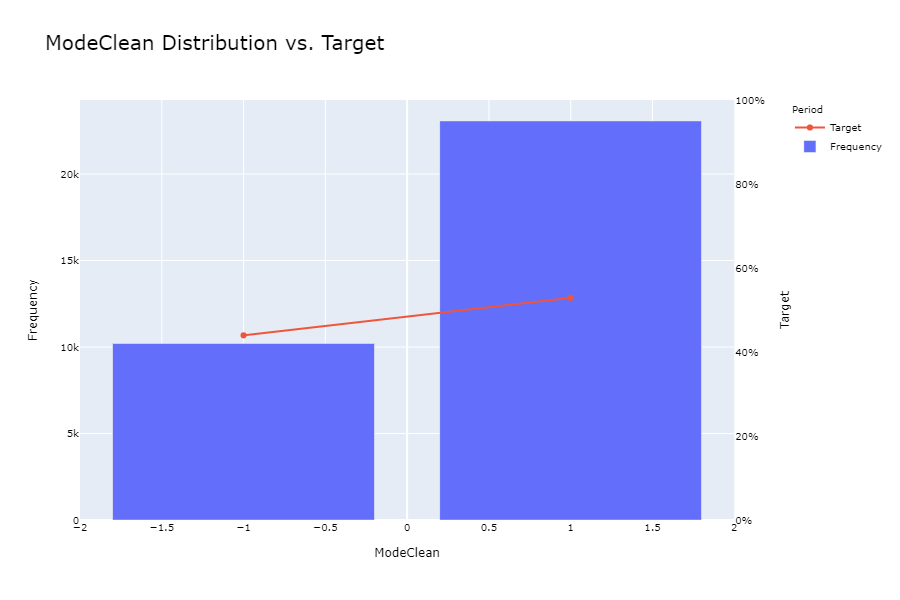

                 Target
AcousticClean          
-1.0           0.564381
 1.0           0.185836
               Target
AcousticClean        
-1.0            27749
 1.0             5521


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




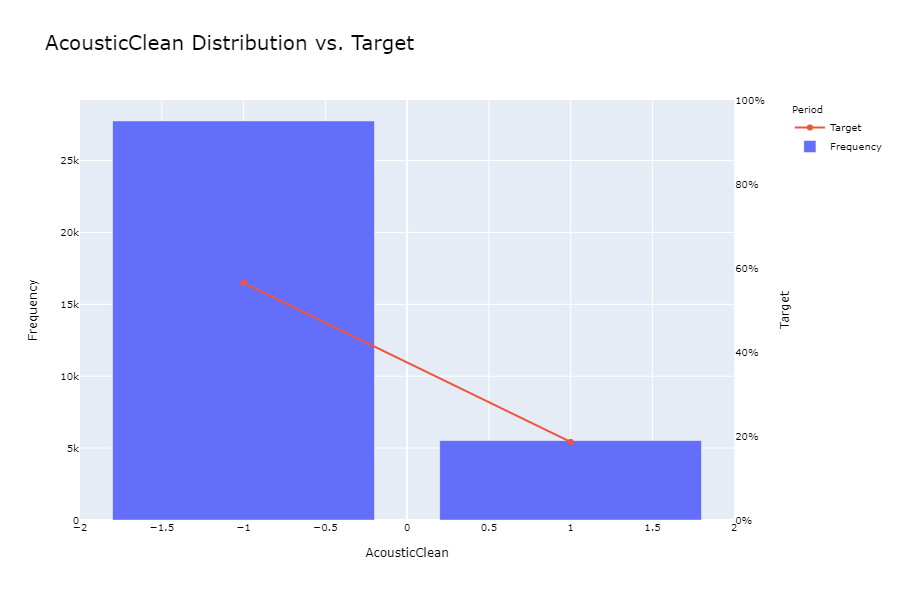

                 Target
FourFourClean          
-1.0           0.292987
 1.0           0.528858
               Target
FourFourClean        
-1.0             3850
 1.0            29420


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




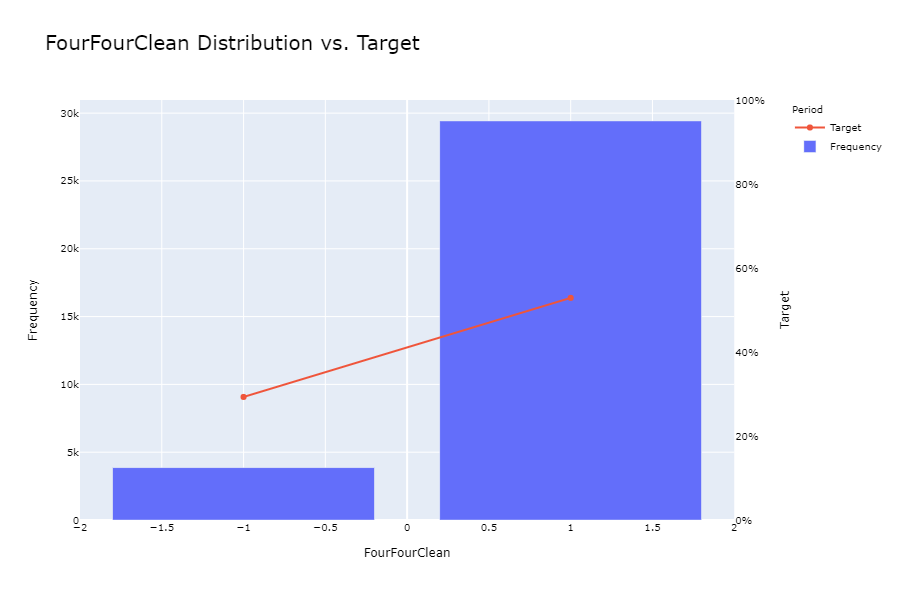

                  Target
LowEnergyClean          
-1.0            0.540319
 1.0            0.115613
                Target
LowEnergyClean        
-1.0             30234
 1.0              3036


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




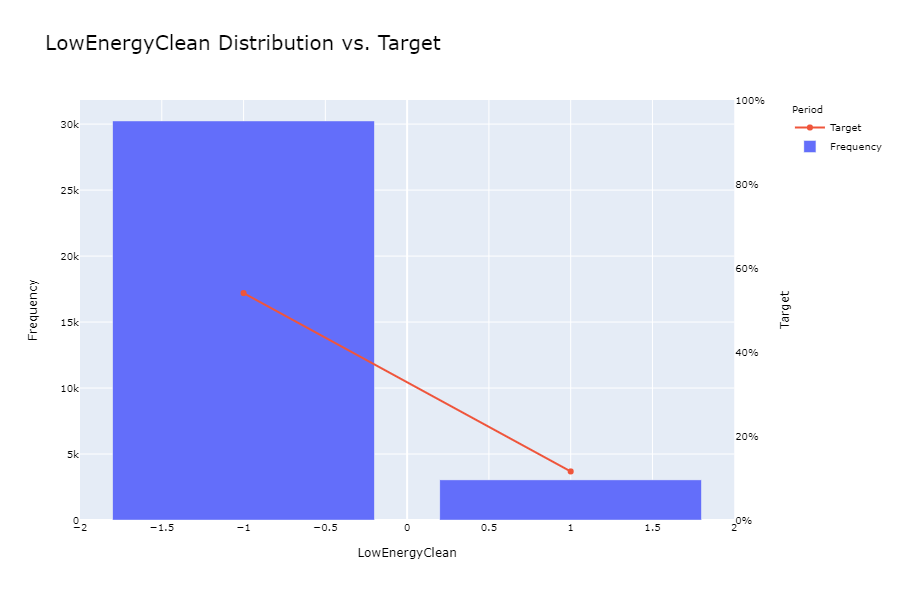

                 Target
LivenessClean          
-1.000000      0.706587
-0.833333      0.664789
-0.666667      0.649789
-0.500000      0.613226
-0.333333      0.596542
-0.166667      0.557545
 0.000000      0.528638
 0.166667      0.524053
 0.333333      0.502717
 0.500000      0.486630
 0.666667      0.472674
 0.833333      0.392185
 1.000000      0.358974
               Target
LivenessClean        
-1.000000         334
-0.833333         710
-0.666667        1185
-0.500000         499
-0.333333         694
-0.166667         391
 0.000000        1065
 0.166667        1954
 0.333333         368
 0.500000       20755
 0.666667        4117
 0.833333         691
 1.000000         507


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




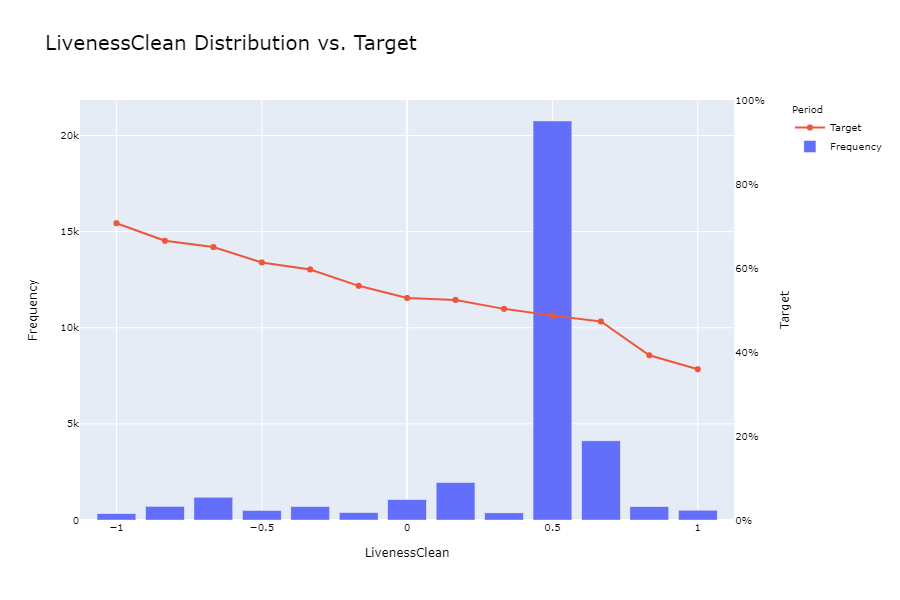

                         Target
InstrumentalnessClean          
-1.000000              0.700703
-0.916667              0.661534
-0.833333              0.645136
-0.750000              0.637062
-0.666667              0.605239
-0.583333              0.575281
-0.500000              0.550325
-0.416667              0.546230
-0.333333              0.519174
-0.250000              0.484396
-0.166667              0.464218
-0.083333              0.443686
 0.000000              0.408952
 0.083333              0.366286
 0.166667              0.313131
 0.250000              0.258706
 0.333333              0.225470
 0.416667              0.212885
 0.500000              0.143594
 0.583333              0.124661
 0.666667              0.087669
 0.750000              0.052521
 0.833333              0.043280
 0.916667              0.042636
 1.000000              0.028634
                       Target
InstrumentalnessClean        
-1.000000                9529
-0.916667                3767
-0.833333       

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




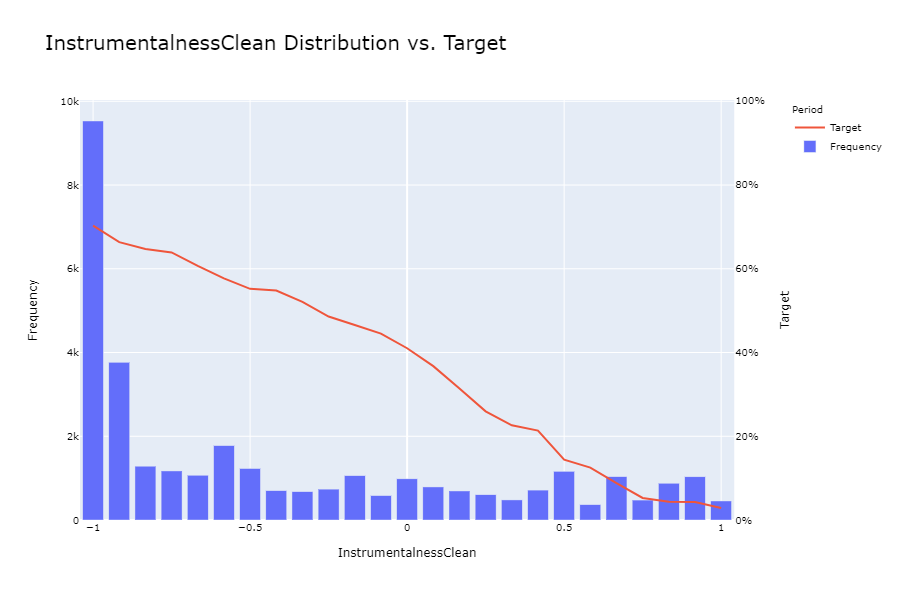

                     Target
DanceabilityClean          
-1.000000          0.018450
-0.939394          0.075175
-0.878788          0.103509
-0.818182          0.185090
-0.757576          0.202899
-0.696970          0.248954
-0.636364          0.259669
-0.575758          0.280248
-0.515152          0.309693
-0.454545          0.320970
-0.393939          0.374790
-0.333333          0.397229
-0.272727          0.401973
-0.212121          0.404085
-0.151515          0.438188
-0.090909          0.448957
-0.030303          0.473844
 0.030303          0.497129
 0.090909          0.525243
 0.151515          0.541139
 0.212121          0.559351
 0.272727          0.573427
 0.333333          0.577747
 0.393939          0.598301
 0.454545          0.598374
 0.515152          0.621067
 0.575758          0.630653
 0.636364          0.642419
 0.696970          0.676393
 0.757576          0.681122
 0.818182          0.702609
 0.878788          0.712297
 0.939394          0.714819
 1.000000          0

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




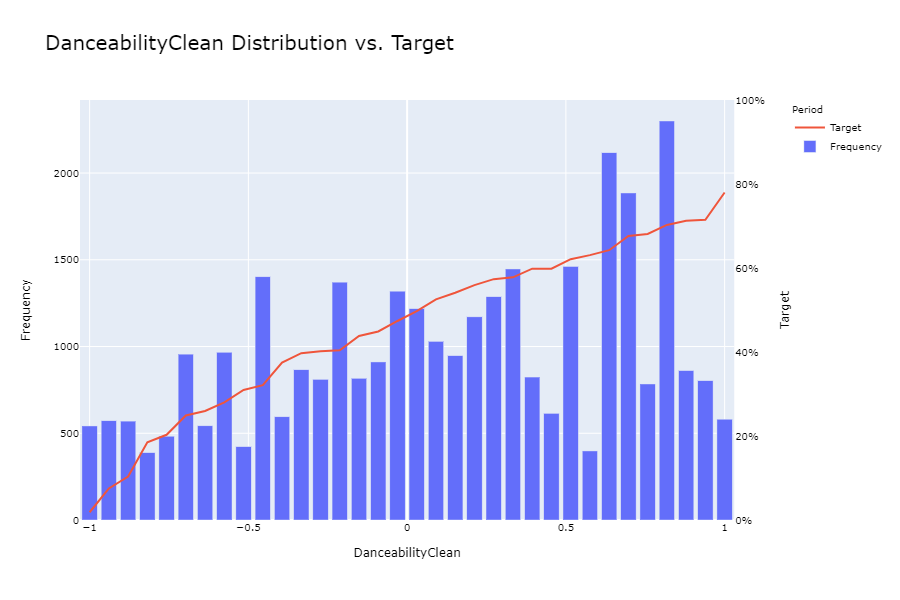

                 Target
LoudnessClean          
-1.000000      0.005164
-0.909091      0.044418
-0.818182      0.087640
-0.727273      0.128329
-0.636364      0.155263
-0.545455      0.220044
-0.454545      0.253317
-0.363636      0.314928
-0.272727      0.349425
-0.181818      0.375519
-0.090909      0.414286
 0.000000      0.451382
 0.090909      0.462585
 0.181818      0.484007
 0.272727      0.491835
 0.363636      0.514103
 0.454545      0.539945
 0.545455      0.548092
 0.636364      0.558763
 0.727273      0.562286
 0.818182      0.576730
 0.909091      0.596528
 1.000000      0.610737
               Target
LoudnessClean        
-1.000000         581
-0.909091         833
-0.818182         445
-0.727273         413
-0.636364         380
-0.545455         459
-0.454545         829
-0.363636         489
-0.272727         435
-0.181818         482
-0.090909         910
 0.000000         977
 0.090909         441
 0.181818        1188
 0.272727        1531
 0.363636         780
 0.4

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




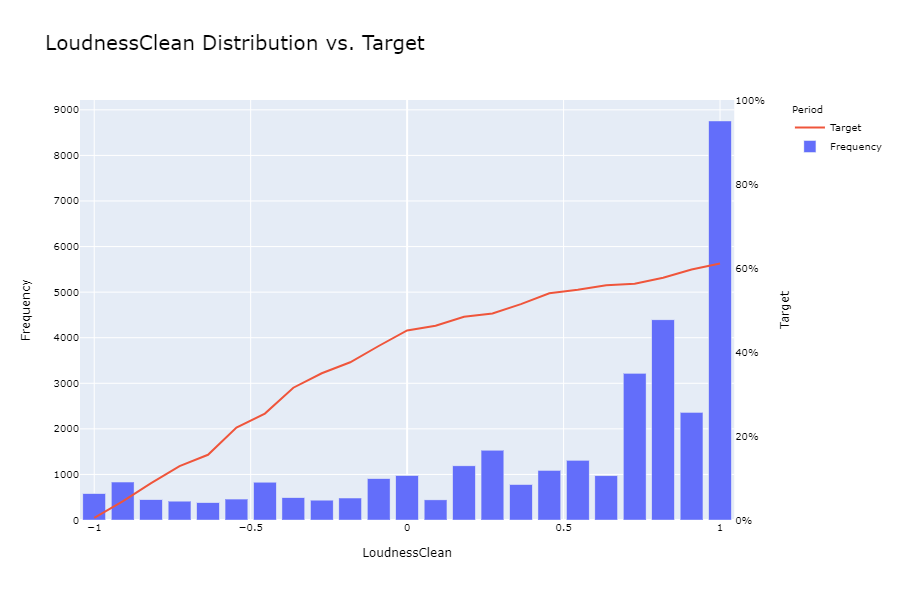

                    Target
Duration_MsClean          
-1.000000         0.005141
-0.928571         0.028139
-0.857143         0.124314
-0.785714         0.320856
-0.714286         0.425347
-0.642857         0.480878
-0.571429         0.493664
-0.500000         0.504967
-0.428571         0.518281
-0.357143         0.520619
-0.285714         0.522822
-0.214286         0.569601
-0.142857         0.594050
-0.071429         0.615809
 0.000000         0.618882
 0.071429         0.640079
 0.142857         0.662455
 0.214286         0.606672
 0.285714         0.601170
 0.357143         0.555245
 0.428571         0.554313
 0.500000         0.529255
 0.571429         0.497345
 0.642857         0.430804
 0.714286         0.354074
 0.785714         0.297907
 0.857143         0.227848
 0.928571         0.162921
 1.000000         0.066202
                  Target
Duration_MsClean        
-1.000000            389
-0.928571            462
-0.857143            547
-0.785714            374
-0.714286    

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




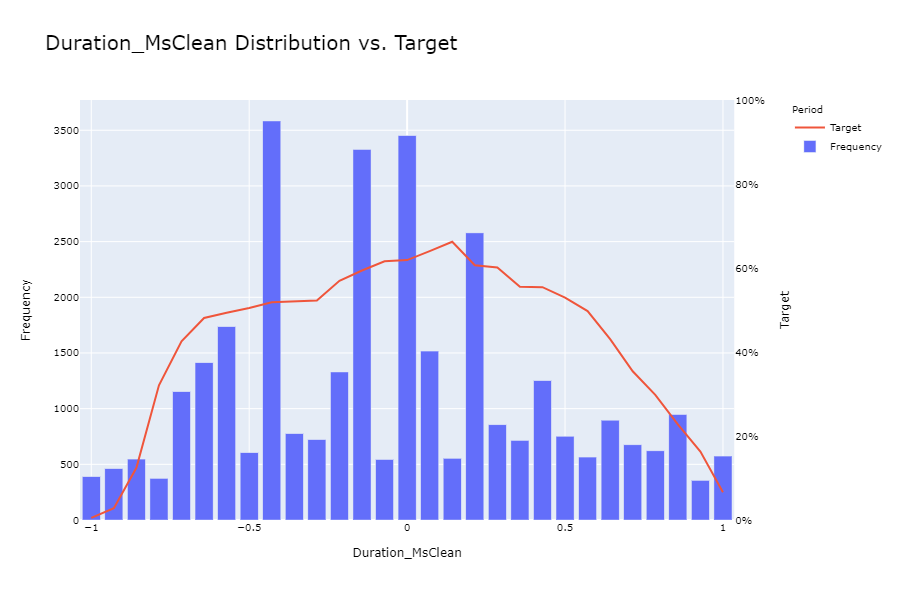

               Target
EnergyClean          
-1.000000    0.019780
-0.947368    0.030220
-0.894737    0.068522
-0.842105    0.094708
-0.789474    0.140878
-0.736842    0.200692
-0.684211    0.225000
-0.631579    0.257549
-0.578947    0.312741
-0.526316    0.328205
-0.473684    0.365546
-0.421053    0.395981
-0.368421    0.421756
-0.315789    0.474114
-0.263158    0.482026
-0.210526    0.507842
-0.157895    0.542936
-0.105263    0.552041
-0.052632    0.593543
 0.000000    0.608071
 0.052632    0.625860
 0.105263    0.625899
 0.157895    0.646242
 0.210526    0.648470
 0.263158    0.648649
 0.315789    0.661972
 0.368421    0.679128
 0.421053    0.666327
 0.473684    0.658088
 0.526316    0.596510
 0.578947    0.595628
 0.631579    0.595372
 0.684211    0.518414
 0.736842    0.471182
 0.789474    0.396800
 0.842105    0.310992
 0.894737    0.287846
 0.947368    0.198347
 1.000000    0.096774
             Target
EnergyClean        
-1.000000       455
-0.947368       364
-0.894737       46

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




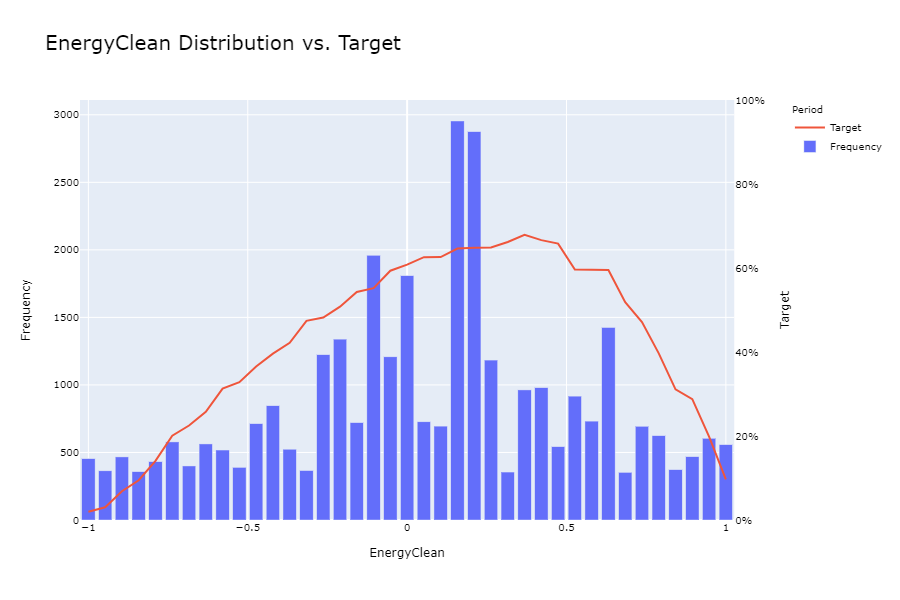

                     Target
AcousticnessClean          
-1.00              0.017157
-0.95              0.060060
-0.90              0.154529
-0.85              0.269634
-0.80              0.332083
-0.75              0.377581
-0.70              0.462354
-0.65              0.505747
-0.60              0.554228
-0.55              0.612396
-0.50              0.656458
-0.45              0.673077
-0.40              0.708789
-0.35              0.708824
-0.30              0.750725
-0.25              0.770538
-0.20              0.701245
-0.15              0.701055
-0.10              0.699297
-0.05              0.683180
 0.00              0.683027
 0.05              0.632009
 0.10              0.601351
 0.15              0.590680
 0.20              0.590223
 0.25              0.514235
 0.30              0.513131
 0.35              0.510909
 0.40              0.470443
 0.45              0.451201
 0.50              0.379808
 0.55              0.366483
 0.60              0.280884
 0.65              0

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




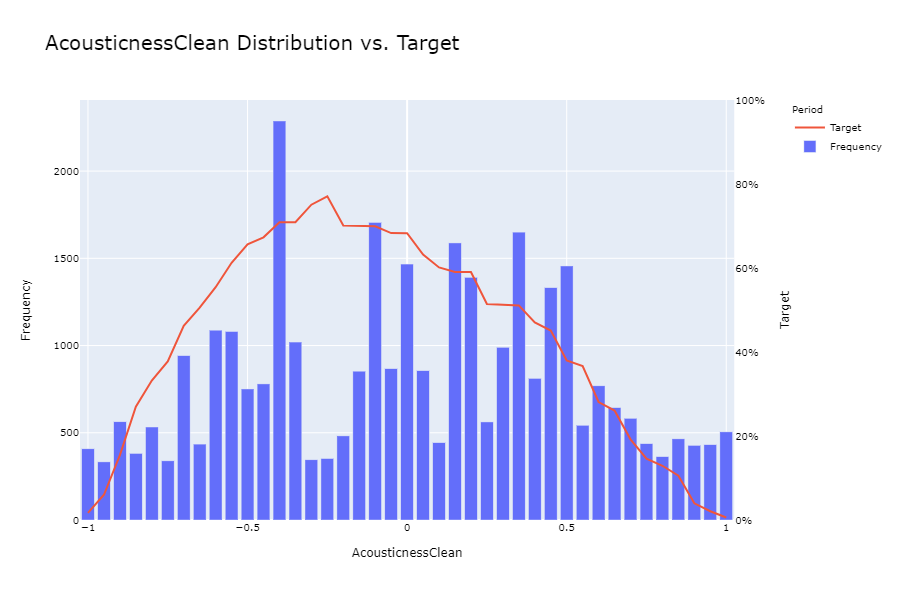

              Target
TempoClean          
-1.000      0.180157
-0.875      0.309645
-0.750      0.444149
-0.625      0.447011
-0.500      0.479257
-0.375      0.501499
-0.250      0.513256
-0.125      0.517710
 0.000      0.557719
 0.125      0.571181
 0.250      0.608621
 0.375      0.573164
 0.500      0.521297
 0.625      0.512927
 0.750      0.485865
 0.875      0.478906
 1.000      0.455738
            Target
TempoClean        
-1.000         383
-0.875         591
-0.750         376
-0.625        3680
-0.500        1615
-0.375        1001
-0.250        4715
-0.125        3162
 0.000        2876
 0.125        1152
 0.250         580
 0.375        1811
 0.500        2653
 0.625        3133
 0.750        3042
 0.875        1280
 1.000        1220


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




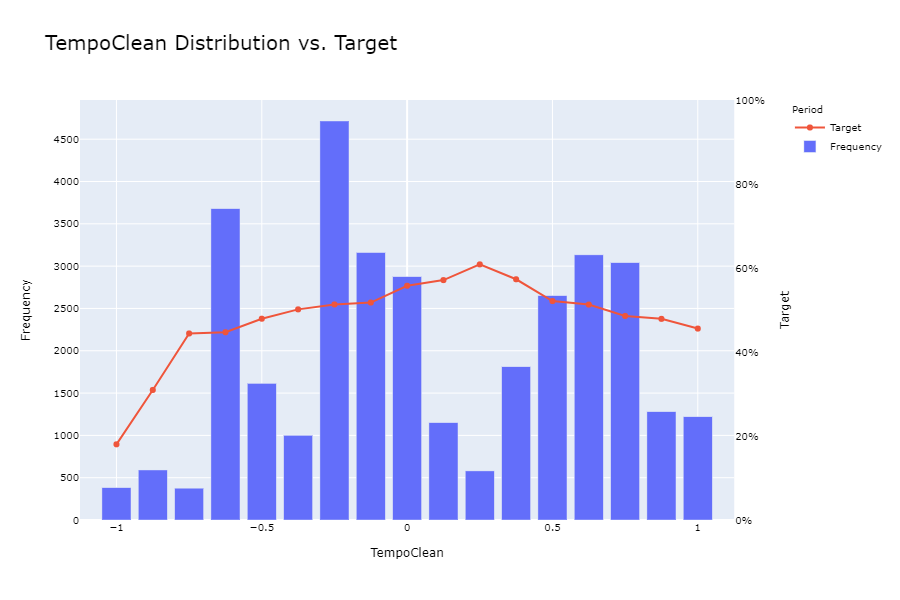

                 Target
SectionsClean          
-1.000000      0.050505
-0.882353      0.123340
-0.764706      0.280310
-0.647059      0.410064
-0.529412      0.495171
-0.411765      0.536400
-0.294118      0.579157
-0.176471      0.588140
-0.058824      0.591120
 0.058824      0.565202
 0.176471      0.550346
 0.294118      0.515024
 0.411765      0.462766
 0.529412      0.412294
 0.647059      0.333333
 0.764706      0.265082
 0.882353      0.154275
 1.000000      0.057778
               Target
SectionsClean        
-1.000000         396
-0.882353         527
-0.764706        1031
-0.647059        1868
-0.529412        3003
-0.411765        3956
-0.294118        4510
-0.176471        4317
-0.058824        3671
 0.058824        2891
 0.176471        2026
 0.294118        1431
 0.411765         940
 0.529412         667
 0.647059         501
 0.764706         547
 0.882353         538
 1.000000         450


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




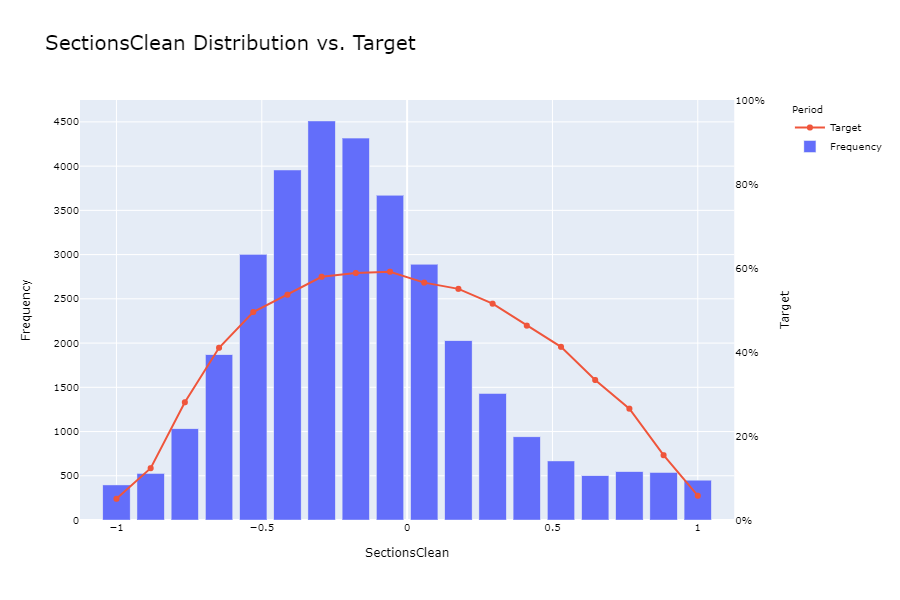

                   Target
Chorus_HitClean          
-1.000000        0.104956
-0.333333        0.429429
 0.333333        0.474308
 1.000000        0.506981
                 Target
Chorus_HitClean        
-1.000000           343
-0.333333           333
 0.333333           506
 1.000000         32088


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




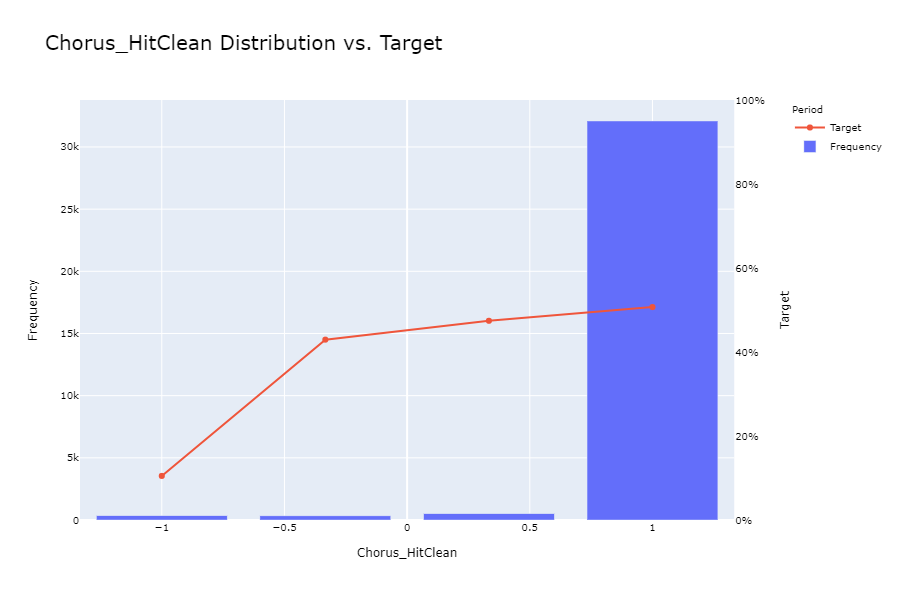

                Target
ValenceClean          
-1.0          0.003976
-0.9          0.030738
-0.8          0.091731
-0.7          0.224385
-0.6          0.292593
-0.5          0.341772
-0.4          0.402271
-0.3          0.429477
-0.2          0.455504
-0.1          0.473331
 0.0          0.505902
 0.1          0.529363
 0.2          0.551149
 0.3          0.569106
 0.4          0.577471
 0.5          0.579431
 0.6          0.602265
 0.7          0.603015
 0.8          0.613071
 0.9          0.615113
 1.0          0.618262
              Target
ValenceClean        
-1.0             503
-0.9             488
-0.8             774
-0.7             976
-0.6             540
-0.5            1106
-0.4            1233
-0.3             631
-0.2            2371
-0.1            2831
 0.0            2965
 0.1            1209
 0.2            2219
 0.3             615
 0.4            2175
 0.5            1196
 0.6            1501
 0.7            2388
 0.8            1928
 0.9            1985
 1.0     

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




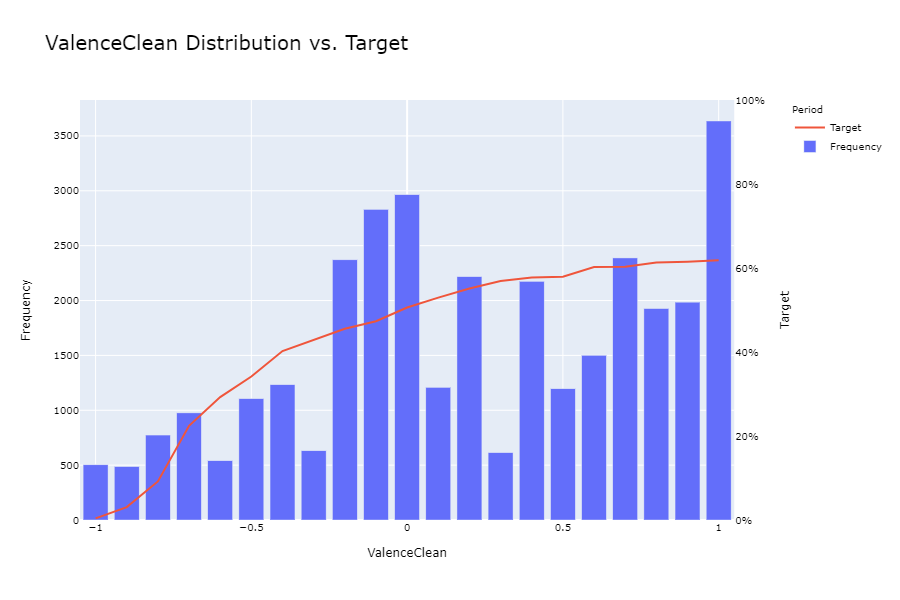

             Target
KeyClean           
-1.000000  0.554772
-0.818182  0.552762
-0.636364  0.544142
-0.454545  0.538299
-0.272727  0.514550
-0.090909  0.493475
 0.090909  0.492219
 0.272727  0.491171
 0.454545  0.479837
 0.636364  0.479350
 0.818182  0.469671
 1.000000  0.460070
           Target
KeyClean         
-1.000000    2693
-0.818182    2227
-0.636364    1801
-0.454545    1893
-0.272727    2268
-0.090909    4138
 0.090909    3984
 0.272727    3058
 0.454545    2703
 0.636364    3632
 0.818182    1154
 1.000000    3719


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




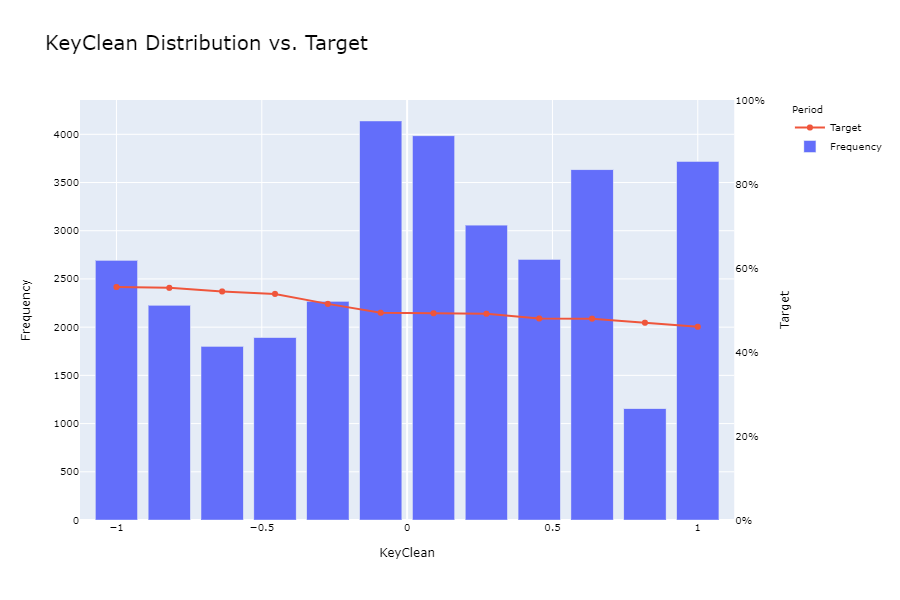

                        Target
LoudnessSquaredClean          
-1.000000             0.005164
-0.995868             0.044418
-0.983471             0.087640
-0.962810             0.128329
-0.933884             0.155263
-0.896694             0.220044
-0.851240             0.253317
-0.797521             0.314928
-0.735537             0.349425
-0.665289             0.375519
-0.586777             0.414286
-0.500000             0.451382
-0.404959             0.462585
-0.301653             0.484007
-0.190083             0.491835
-0.070248             0.514103
 0.057851             0.539945
 0.194215             0.548092
 0.338843             0.558763
 0.491736             0.562286
 0.652893             0.576730
 0.822314             0.596528
 1.000000             0.610737
                      Target
LoudnessSquaredClean        
-1.000000                581
-0.995868                833
-0.983471                445
-0.962810                413
-0.933884                380
-0.896694             

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




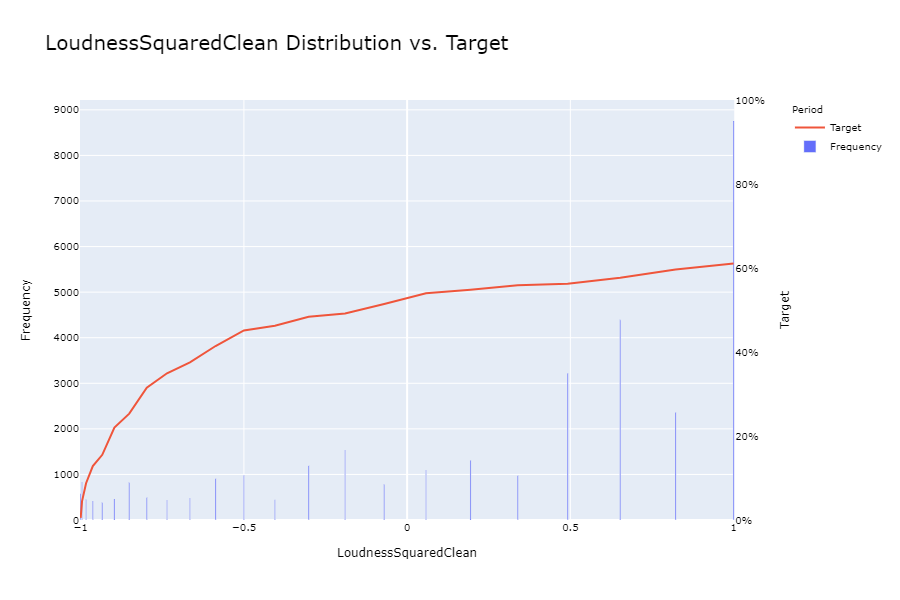

                           Target
Duration_MsSquaredClean          
-1.000000                0.005141
-0.997449                0.028139
-0.989796                0.124314
-0.977041                0.320856
-0.959184                0.425347
-0.936224                0.480878
-0.908163                0.493664
-0.875000                0.504967
-0.836735                0.518281
-0.793367                0.520619
-0.744898                0.522822
-0.691327                0.569601
-0.632653                0.594050
-0.568878                0.615809
-0.500000                0.618882
-0.426020                0.640079
-0.346939                0.662455
-0.262755                0.606672
-0.173469                0.601170
-0.079082                0.555245
 0.020408                0.554313
 0.125000                0.529255
 0.234694                0.497345
 0.349490                0.430804
 0.469388                0.354074
 0.594388                0.297907
 0.724490                0.227848
 0.859694     

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




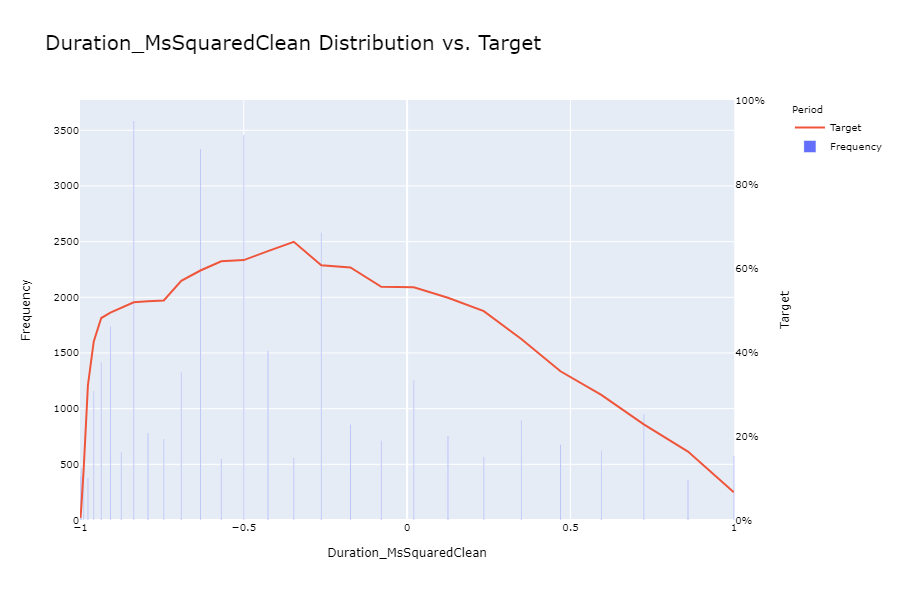

                      Target
EnergySquaredClean          
-1.000000           0.019780
-0.998615           0.030220
-0.994460           0.068522
-0.987535           0.094708
-0.977839           0.140878
-0.965374           0.200692
-0.950139           0.225000
-0.932133           0.257549
-0.911357           0.312741
-0.887812           0.328205
-0.861496           0.365546
-0.832410           0.395981
-0.800554           0.421756
-0.765928           0.474114
-0.728532           0.482026
-0.688366           0.507842
-0.645429           0.542936
-0.599723           0.552041
-0.551247           0.593543
-0.500000           0.608071
-0.445983           0.625860
-0.389197           0.625899
-0.329640           0.646242
-0.267313           0.648470
-0.202216           0.648649
-0.134349           0.661972
-0.063712           0.679128
 0.009695           0.666327
 0.085873           0.658088
 0.164820           0.596510
 0.246537           0.595628
 0.331025           0.595372
 0.418283     

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




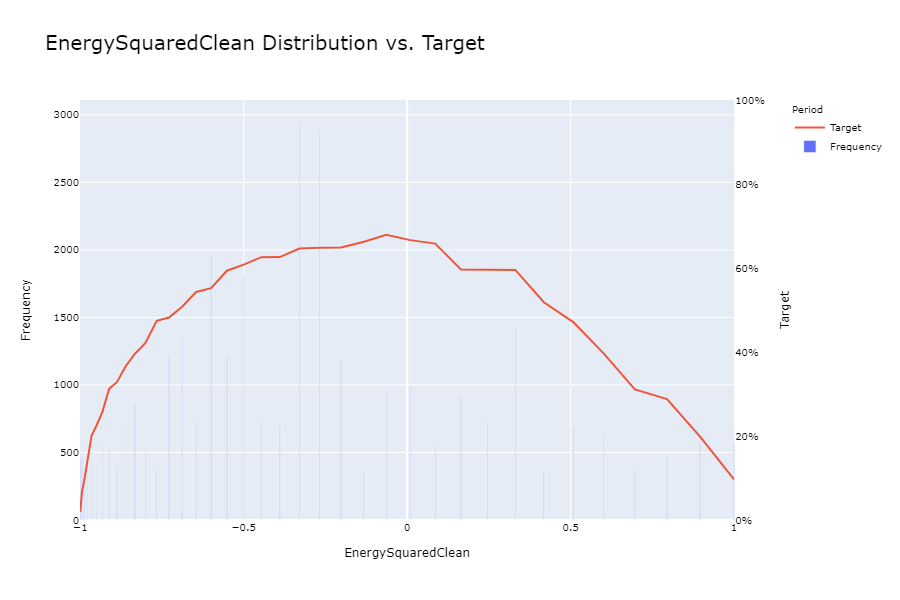

                            Target
AcousticnessSquaredClean          
-1.00000                  0.017157
-0.99875                  0.060060
-0.99500                  0.154529
-0.98875                  0.269634
-0.98000                  0.332083
-0.96875                  0.377581
-0.95500                  0.462354
-0.93875                  0.505747
-0.92000                  0.554228
-0.89875                  0.612396
-0.87500                  0.656458
-0.84875                  0.673077
-0.82000                  0.708789
-0.78875                  0.708824
-0.75500                  0.750725
-0.71875                  0.770538
-0.68000                  0.701245
-0.63875                  0.701055
-0.59500                  0.699297
-0.54875                  0.683180
-0.50000                  0.683027
-0.44875                  0.632009
-0.39500                  0.601351
-0.33875                  0.590680
-0.28000                  0.590223
-0.21875                  0.514235
-0.15500            

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




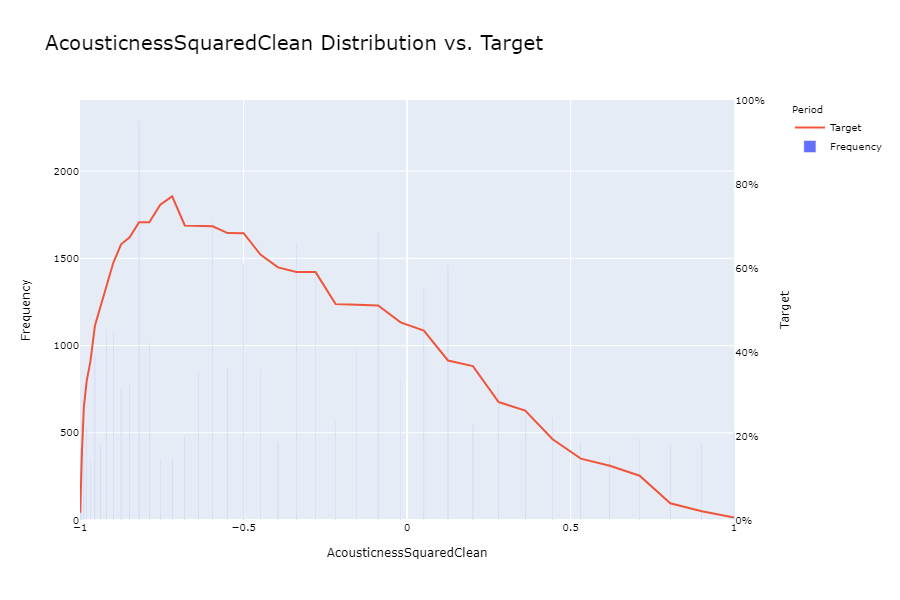

                     Target
TempoSquaredClean          
-1.000000          0.180157
-0.992188          0.309645
-0.968750          0.444149
-0.929688          0.447011
-0.875000          0.479257
-0.804688          0.501499
-0.718750          0.513256
-0.617188          0.517710
-0.500000          0.557719
-0.367188          0.571181
-0.218750          0.608621
-0.054688          0.573164
 0.125000          0.521297
 0.320312          0.512927
 0.531250          0.485865
 0.757812          0.478906
 1.000000          0.455738
                   Target
TempoSquaredClean        
-1.000000             383
-0.992188             591
-0.968750             376
-0.929688            3680
-0.875000            1615
-0.804688            1001
-0.718750            4715
-0.617188            3162
-0.500000            2876
-0.367188            1152
-0.218750             580
-0.054688            1811
 0.125000            2653
 0.320312            3133
 0.531250            3042
 0.757812            1280


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




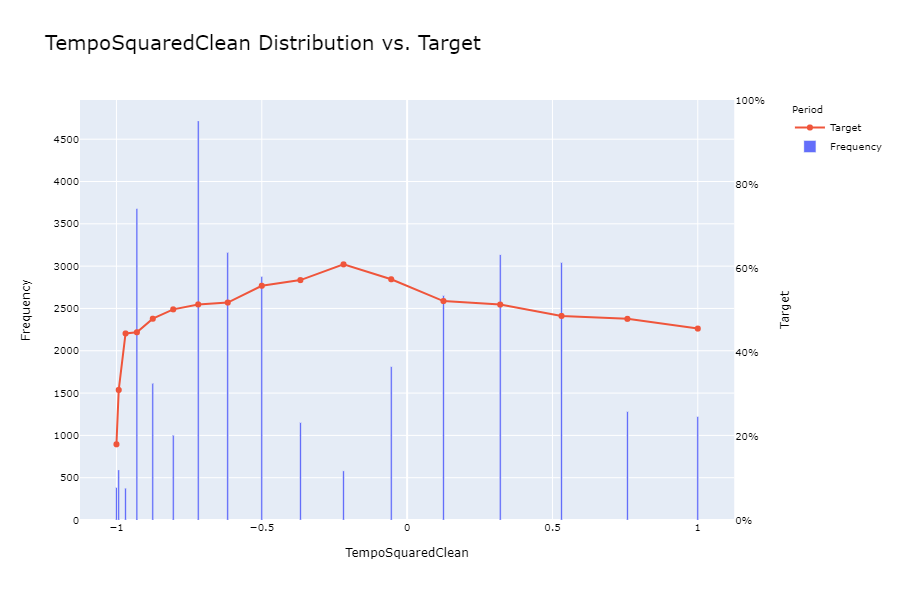

                        Target
SectionsSquaredClean          
-1.000000             0.050505
-0.993080             0.123340
-0.972318             0.280310
-0.937716             0.410064
-0.889273             0.495171
-0.826990             0.536400
-0.750865             0.579157
-0.660900             0.588140
-0.557093             0.591120
-0.439446             0.565202
-0.307958             0.550346
-0.162630             0.515024
-0.003460             0.462766
 0.169550             0.412294
 0.356401             0.333333
 0.557093             0.265082
 0.771626             0.154275
 1.000000             0.057778
                      Target
SectionsSquaredClean        
-1.000000                396
-0.993080                527
-0.972318               1031
-0.937716               1868
-0.889273               3003
-0.826990               3956
-0.750865               4510
-0.660900               4317
-0.557093               3671
-0.439446               2891
-0.307958               2026
-0.

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




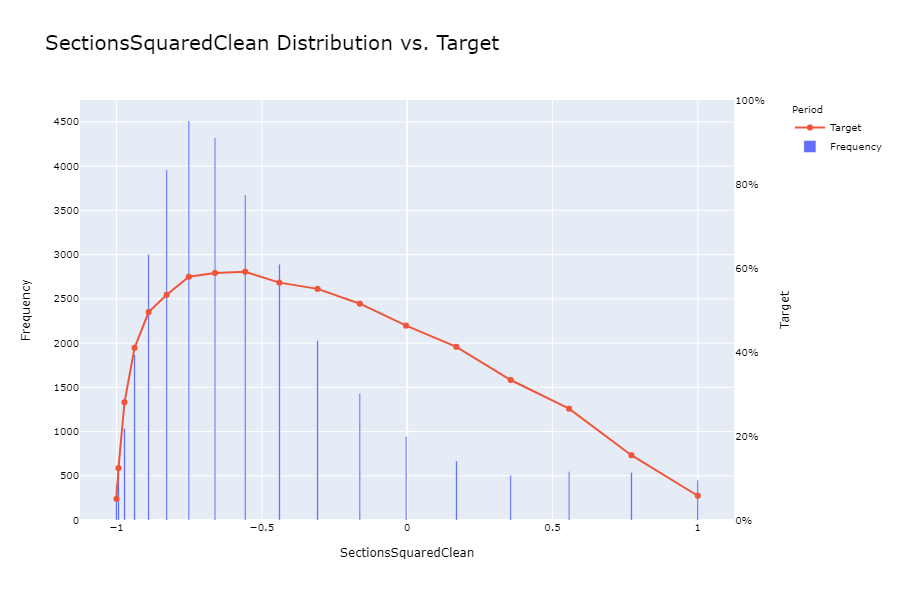

                          Target
Chorus_HitSquaredClean          
-1.000000               0.104956
-0.777778               0.429429
-0.111111               0.474308
 1.000000               0.506981
                        Target
Chorus_HitSquaredClean        
-1.000000                  343
-0.777778                  333
-0.111111                  506
 1.000000                32088


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




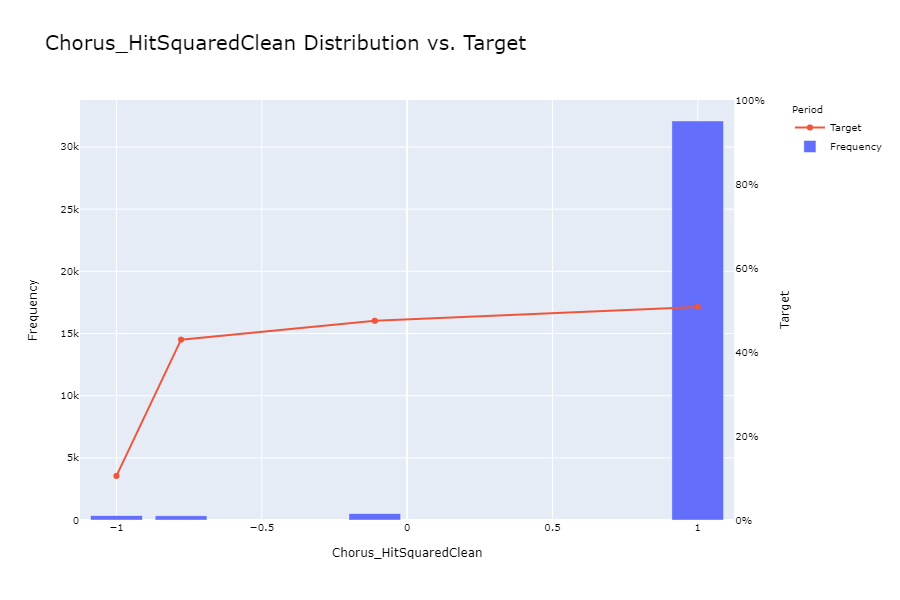

                    Target
ValenceSqrtClean          
-1.000000         0.003976
-0.552786         0.030738
-0.367544         0.091731
-0.225403         0.224385
-0.105573         0.292593
 0.000000         0.341772
 0.095445         0.402271
 0.183216         0.429477
 0.264911         0.455504
 0.341641         0.473331
 0.414214         0.505902
 0.483240         0.529363
 0.549193         0.551149
 0.612452         0.569106
 0.673320         0.577471
 0.732051         0.579431
 0.788854         0.602265
 0.843909         0.603015
 0.897367         0.613071
 0.949359         0.615113
 1.000000         0.618262
                  Target
ValenceSqrtClean        
-1.000000            503
-0.552786            488
-0.367544            774
-0.225403            976
-0.105573            540
 0.000000           1106
 0.095445           1233
 0.183216            631
 0.264911           2371
 0.341641           2831
 0.414214           2965
 0.483240           1209
 0.549193           2219
 0.6

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




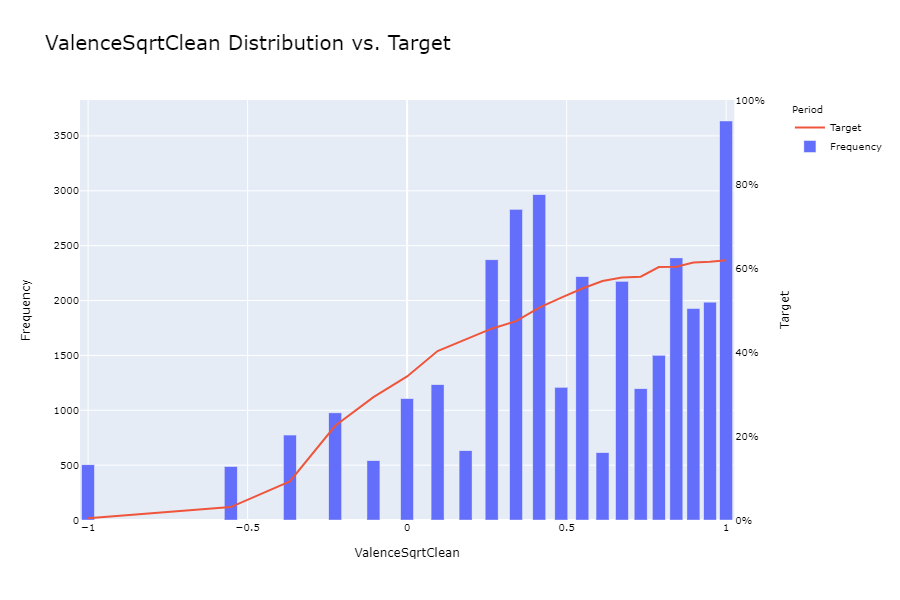

In [29]:
for Variable in ModVarsClean:
    Scaler = MinMaxScaler(feature_range=(-1, 1))
    Scaler = Scaler.fit(Train[Variable].values.reshape(-1, 1))
    Train[Variable] = Scaler.transform(Train[Variable].values.reshape(-1, 1))
    Test[Variable] = Scaler.transform(Test[Variable].values.reshape(-1, 1))
    
    BinPlot(Train, Variable, "Target")

## Variable Correlations

In [30]:
Correlation(Train, sorted(ModVarsClean)+["Target"], "CorrelationPlot")

In [31]:
OverFit = []
for i in Train.columns:
    Counts = Train[i].value_counts()
    Zeros = Counts.iloc[0]
    if Zeros / len(Train) * 100 > 99.94:
        OverFit.append(i)
        print(Counts)

OverFit = list(OverFit)
print(OverFit)
#X_train = X_train.drop(overfit, axis=1)
#print(X_train.shape)

Train    33270
Name: Population, dtype: int64
['Population']


## Modelling

In [32]:
X = ['AcousticClean', 'DanceabilityClean', 'Duration_MsClean', 'Duration_MsSquaredClean'
                , 'EnergyClean', 'EnergySquaredClean', 'FourFourClean', 'InstrumentalnessClean', 'KeyClean'
                , 'LivenessClean', 'LoudnessClean', 'LoudnessSquaredClean', 'LowEnergyClean', 'ModeClean'
                , 'SectionsClean', 'SectionsSquaredClean', 'ValenceClean', 'ValenceSqrtClean']

Y = "Target"

### Logistic Regression

In [33]:
Mod = LogisticRegression(penalty='l1', solver='liblinear', fit_intercept=True)
Mod = Mod.fit(Train[X], Train[Y])
TrainPreds = Mod.predict(Train[X])
Mod.score(Train[X], Train[Y])

0.7519687406071536

In [34]:
FeatureImportance = {}
for i in range(len(X)):
    FeatureImportance[X[i]] = np.abs(Mod.coef_[0][i])
FeatureImportance = pd.DataFrame(FeatureImportance, index=[1,])
FeatureImportance = FeatureImportance.T.sort_values(by=1).T

In [35]:
confusion_matrix(TrainPreds, Train[Y])

array([[11456,  3125],
       [ 5127, 13562]], dtype=int64)

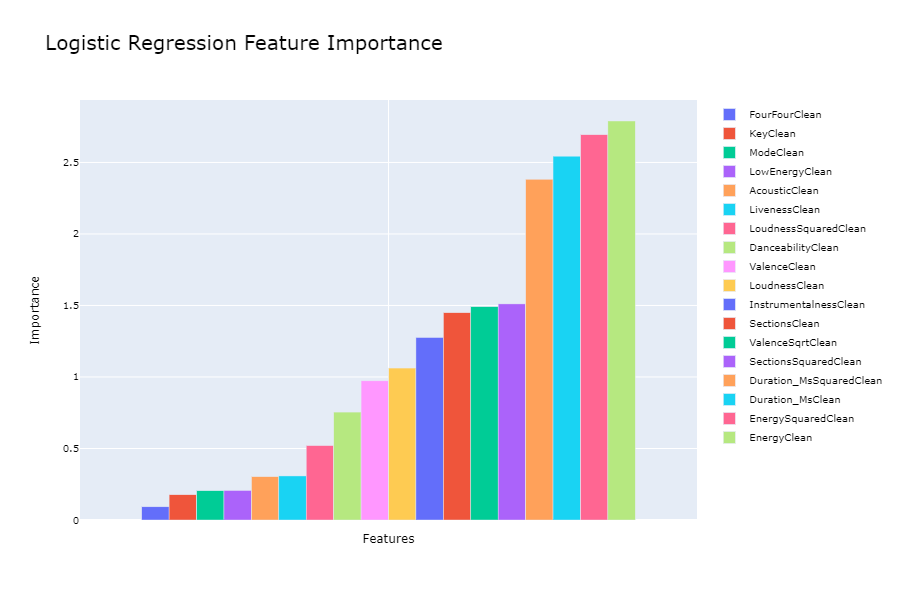

In [36]:
BarPlot(FeatureImportance, "Logistic Regression Feature Importance")

### Decision Tree

In [54]:
Mod = tree.DecisionTreeClassifier()
Mod = Mod.fit(Train[["EnergyClean", "EnergySquaredClean"]], Train[Y])
#TrainPreds = Mod.predict(Train[X])
#Mod.score(Train[X], Train[Y])

In [55]:
confusion_matrix(TrainPreds, Train[Y])

array([[11456,  3125],
       [ 5127, 13562]], dtype=int64)

In [58]:
#Assess decision tree performance and compare with Logistic Regression

In [59]:
#Use new models such as SVC etc.